# Imports

In [1]:
import os, sys, gc, warnings
import numpy as np
import pandas as pd
import time
import xgboost
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import plotly
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
import statsmodels.api as sm

from plotly import tools
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
from IPython.display import display, HTML
from IPython.core.interactiveshell import InteractiveShell
from IPython.display import SVG

from statsmodels.stats.outliers_influence import variance_inflation_factor
from xgboost import XGBClassifier
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from hyperopt import fmin, tpe, hp, SparkTrials, STATUS_OK, Trials, STATUS_FAIL, space_eval
from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
from functools import partial

pd.set_option('display.float_format', lambda x: '%.3f' % x)

plotly.offline.init_notebook_mode()
warnings.filterwarnings("ignore")
InteractiveShell.ast_node_interactivity = "all"
pd.set_option('max_rows', None)
pd.set_option('max_columns', None)
pd.set_option('display.max_colwidth', 100)
display(HTML(data="""<style> div#notebook-container{width:95%;}</style>"""))
warnings.filterwarnings("ignore", category=DeprecationWarning) 

/opt/conda/lib/python3.7/site-packages/geopandas/_compat.py:115: UserWarning: The Shapely GEOS version (3.9.1-CAPI-1.14.2) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  shapely_geos_version, geos_capi_version_string


# Datasets 

A brief summary of the datasets used for running the models and comparison:
- Dataset 1: The heart failure prediction daaset which was created by combining different datasets already available independently but not combined before. In this dataset, over 11 common features predicting heart failureare avaiable for research purposes. 
    - Source: https://www.kaggle.com/datasets/fedesoriano/heart-failure-prediction
- Dataset 2: Bankruptcy data from the Taiwan Economic Journal for the years 1999–2009. The data were collected from the Taiwan Economic Journal for the years 1999 to 2009 and company bankruptcy was defined based on the business regulations of the Taiwan Stock Exchange.
    - Source: https://www.kaggle.com/datasets/fedesoriano/company-bankruptcy-prediction
- Dataset 3: The Vehicle Emissions and Smog Rating Classification dataset which has the amount of CO2 emissions by a vehicle depending on their various features. This dataset contains the official records of CO2 emissions data by various cars of different features. There are total of 26075 rows and 12 columns.  
    - Source: https://www.kaggle.com/datasets/abhikdas2809/canadacaremissions
- Dataset 4: The forest cover type prediction dataset contains tree observations from four areas of the Roosevelt National Forest in Colorado. All observations are cartographic variables (no remote sensing) from 30 meter x 30 meter sections of forest. There are over half a million measurements total! This dataset includes information on tree type, shadow coverage, distance to nearby landmarks (roads etcetera), soil type, and local topography.
    - Source: https://www.kaggle.com/datasets/uciml/forest-cover-type-dataset

# Problem Statement 
The project goal is to improve the feature selection element in the data science pipeline by exploring the use of polynomial features in feature engineering for tabular data.

Polynomial features: Polynomial features are used to create new features by raising the
original features to a power. This can be useful for handling non-linear relationships between the features and the target variable

**Here's an example of how polynomial features can be used to handle non-linear
relationships:**
- Consider a dataset with two features, x1 and x2, and a target variable y. A linear model, such as a linear regression, would model the relationship between x1 and x2 to y using a straight line. However, if there is a non-linear relationship between x1, x2, and y, a linear model may not be able to capture it.
- In this case, polynomial features can be used to create new features by raising x1 and x2 to a power. For example, creating new features x1^2, x1*x2, x2^2 and so on. This can capture the non-linear relationship between x1, x2, and y. The new features can be used in a linear model, such as linear regression, to improve its performance.

# Solution

1. Investigating the use of polynomial feature expansion as a method for feature engineering in tabular data: The idea is to explore the use of polynomial features in feature engineering for tabular data to improve the performance of machine learning models. By raising the original features to a power, new features can be created that may capture non-linear relationships between the features and the target variable.
2. Comparison of performance of machine learning models with and without polynomial features: The idea is to compare the performance of machine learning models trained on data with and without polynomial features to evaluate the effectiveness of the method. This will be done by comparing the performance metrics such as accuracy, precision, recall, and F1-score on a holdout set or using cross-validation.

# Experiment plan 
- **Exploratory Data Analysis:** We will try to understand the relationship between each input variable we are feeding into the model and the target under consideration. This will help further in interpreting the different comparisons we draw between the raw features and transformed polynomial features as it will show us the kind of relationships (linear vs. non-linear) present in the data.
    - For this we will draw histograms for each independent feature, pair plots showing correlation pair wise of dependent variable with independent variables.
    - Understanding correlation structures in the data is important because some alogirthms like logistic regression (we are doing classification) doesn't work well with multi-collinear datasets.
- **Data Processing:** We do a series of steps to prepare the data for modelling.
    - **One hot encoding:** If categorical features are present in the data, we encode them with one hot encoding. The one hot encoded features are not conisdered for polynomial features.
    - **Scaling the numerical features:** We perform standard scaling on the numerical features.
    - Resamplig: When the data set has more than 10000 records, we sample from both the classes (5000 each) so that we can finish tranining the models within reasonable time due to computational limits.
    - **Feature Selection:** We also remove highly collinear features using VIF and after this step, if there are more than 15 features, we limit to top 15 correlated (with target) using Anova.
    -  **Creating polyonmial features:** We will construct and repeat the experiment for different degree of polynomial (2, 3) to check how the performance is affected with increasing degree of polynomial.
        - Going more than degree 3 is not advisable as it will explode the number of combinations and inturn features present in the input data we feed into the models.
    - **Train-Test Splitting:** We will be splitting each dataset into a training set and a test set (75 to 25 split). The training set will be used to train the machine learning models, while the test set will be used to evaluate their performance.
- **Model training:** We will use a variety of machine learning models to evaluate the effectiveness of polynomial feature expansion across different types of models.
    - **Models chosen:** Logistic regression, Elastic net classifier, Support Vector classifier, K-Nearest Neighbour classifier, Linear Discriminant Analysis classifier (LDA), Quadratic Discriminant Analysis (QDA) classifier, Naive Bayes classifier, Random forest classifier, XGBoost classifier
    - Hyper-parameter tuning: We tune the above selected models using bayesian hyper-optimization using cross validation of 5 folds. We use sci-kit learn library for algorithms and hyperopt for tuning.
- **Evaluation**
    - We compare the performance of models with and without polynomial features. We will train the models both with and without polynomial features and compare their performance using metrics accuracy, precision, recall, and F1-score.

Finally we will summarise the effectiveness/usefulness of our solution on the 4 different datasets chosen for the project. By testing the solution on multiple datasets and using a variety of machine learning models, we can determine the effectiveness and usefulness of polynomial feature expansion in
improving the performance of models for tabular data.

In [2]:
import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/canadacaremissions/CanadaCarEmissions.xlsx
/kaggle/input/heart-failure-prediction/heart.csv
/kaggle/input/forest-cover-type-dataset/covtype.csv
/kaggle/input/company-bankruptcy-prediction/data.csv


# Functions

In [3]:
# Function for pre-processing the data which has combination of categorica and numerical columns
def pre_process_data(df,y_col,categoricals_default=[],split=0.2,set_seed=2047):
    
    start = time.time()
    
    # Get list of numerical and categorical columns
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    numeric_cols = [col for col in df.select_dtypes(include=numerics).columns 
                    if col not in [y_col]+categoricals_default]
    categorical_cols = [col for col in list(df) if col not in numeric_cols+[y_col]]
    categorical_cols = categorical_cols+categoricals_default
    
    print(f'Encoding categorical columns ',end='... ')
    # Encode categorical columns with one hot encoding
    X_cat = pd.get_dummies(df[categorical_cols])
    x_ohe_col_names = list(X_cat)

    ### --- Processing raw dataset --- ###
    # Join the processed categorical columns with numerical columns
    X_processed = pd.concat([df[numeric_cols],X_cat],axis=1)
    print(f'{round((time.time()-start)/60,3)} mins elapsed.')
    
    # Train test split with 80:20 split
    print(f'Splitting the data ',end='... ')
    X_train, X_test, y_train, y_test = train_test_split(
        X_processed, df[y_col],test_size=split,random_state=set_seed)
    print(f'{round((time.time()-start)/60,3)} mins elapsed.')

    # Scaling the numerical columns
    # Fit the scaler and transform train set
    print(f'Scaling the data ',end='... ')
    num_scaler_raw = StandardScaler(
        copy=True, with_mean=True, with_std=True).fit(X_train[numeric_cols])
    X_train_num_processed = pd.DataFrame(
        num_scaler_raw.transform(X_train[numeric_cols]),
        columns=numeric_cols)
    X_train_all = pd.concat(
        [X_train_num_processed.reset_index(drop=True),
         X_train[x_ohe_col_names].reset_index(drop=True)],
        axis=1,ignore_index=True)
    
    # Transform the test set
    X_test_num_processed = pd.DataFrame(
        num_scaler_raw.transform(X_test[numeric_cols]), 
        columns=numeric_cols)
    X_test_all = pd.concat([
        X_test_num_processed.reset_index(drop=True),
        X_test[x_ohe_col_names].reset_index(drop=True)],
        axis=1,ignore_index=True)
    print(f'{round((time.time()-start)/60,3)} mins elapsed.')
        
    ### --- Construct and process polynomials of degree 2 & 3 --- ###
    # Create interaction terms where interaction is for each regressor pair + polynomial
    # Fit-transform the polynomial model for degree 2
    print(f'Fitting polynoimials of degree 2 to numericals in data ',end='... ')
    poly_deg2 = PolynomialFeatures(
        degree = 2,include_bias = False,interaction_only = False,order = 'C')
    X_poly_deg2_train = pd.DataFrame(
        poly_deg2.fit_transform(X_train[numeric_cols]),
        columns=poly_deg2.get_feature_names(input_features=numeric_cols))
    X_poly_deg2_test = pd.DataFrame(
        poly_deg2.fit_transform(X_test[numeric_cols]),
        columns=poly_deg2.get_feature_names(input_features=numeric_cols))

    # Scaling the poly fetures - degree 2
    num_scaler_poly2 = StandardScaler(
        copy=True, with_mean=True, with_std=True).fit(X_poly_deg2_train)
    X_poly_deg2_train_scaled = pd.DataFrame(
        num_scaler_poly2.transform(X_poly_deg2_train), 
        columns=X_poly_deg2_train.columns)
    X_poly_deg2_test_scaled = pd.DataFrame(
        num_scaler_poly2.transform(X_poly_deg2_test),
        columns=X_poly_deg2_test.columns)

    # Combine the scaled polynomial feautres with one hot columns
    X_train_poly2_all = pd.concat([
        X_poly_deg2_train_scaled.reset_index(drop=True),
        X_train[x_ohe_col_names].reset_index(drop=True)],
        axis=1,ignore_index=True)
    X_test_poly2_all = pd.concat([
        X_poly_deg2_test_scaled.reset_index(drop=True),
        X_test[x_ohe_col_names].reset_index(drop=True)],
        axis=1,ignore_index=True)
    print(f'{round((time.time()-start)/60,3)} mins elapsed.')
        
    print(f'Fitting polynoimials of degree 3 to numericals in data ',end='... ')
    # Fit-transform the polynomial model for degree 3
    poly_deg3 = PolynomialFeatures(
        degree=3, include_bias=False, interaction_only=False, order='C')
    X_poly_deg3_train = pd.DataFrame(
        poly_deg3.fit_transform(X_train[numeric_cols]),
        columns=poly_deg3.get_feature_names(input_features=numeric_cols))
    X_poly_deg3_test = pd.DataFrame(
        poly_deg3.fit_transform(X_test[numeric_cols]),
        columns=poly_deg3.get_feature_names(input_features=numeric_cols))

    # Scaling the poly features - degree 3
    num_scaler_poly3 = StandardScaler(
        copy=True, with_mean=True, with_std=True).fit(X_poly_deg3_train)
    X_poly_deg3_train_scaled = pd.DataFrame(
        num_scaler_poly3.transform(X_poly_deg3_train), 
        columns=X_poly_deg3_train.columns)
    X_poly_deg3_test_scaled = pd.DataFrame(
        num_scaler_poly3.transform(X_poly_deg3_test),
        columns=X_poly_deg3_test.columns)

    # Combine the scaled polynomial feautres with one hot columns
    X_train_poly3_all = pd.concat([
        X_poly_deg3_train_scaled.reset_index(drop=True),
        X_train[x_ohe_col_names].reset_index(drop=True)],
        axis=1,ignore_index=True)
    X_test_poly3_all = pd.concat([
        X_poly_deg3_test_scaled.reset_index(drop=True),
        X_test[x_ohe_col_names].reset_index(drop=True)],
        axis=1,ignore_index=True)
    print(f'{round((time.time()-start)/60,3)} mins elapsed.')
    
    return [
        numeric_cols,categorical_cols,x_ohe_col_names,
        y_train, y_test,
        X_train_all, X_test_all, 
        X_train_poly2_all, X_test_poly2_all,
        X_train_poly3_all, X_test_poly3_all]

In [4]:
# We will modify the above function to work for a dataset with no categorical columns
def pre_process_data_non_cat(df,y_col,split=0.2,set_seed=2047):
    
    start = time.time()
    
    # Get list of numerical and categorical columns
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    numeric_cols = [col for col in df.select_dtypes(include=numerics).columns if col not in [y_col]]
    categorical_cols = [col for col in list(df) if col not in numeric_cols+[y_col]]

    ### --- Processing raw dataset --- ###
    
    if not len(categorical_cols) == 0:
        print(f'Encoding categorical columns ',end='... ')
        # Encode categorical columns with one hot encoding
        X_cat = pd.get_dummies(df[categorical_cols])
        x_ohe_col_names = list(X_cat)
        
        # Join the processed categorical columns with numerical columns
        X_processed = pd.concat([df[numeric_cols],X_cat],axis=1)
        print(f'{round((time.time()-start)/60,3)} mins elapsed.')
        
    else:
        X_processed = df[numeric_cols].copy()
        x_ohe_col_names = []
    
    # Train test split with 80:20 split
    print(f'Splitting the data ',end='... ')
    X_train, X_test, y_train, y_test = train_test_split(X_processed, df[y_col],test_size=split,random_state=set_seed)
    print(f'{round((time.time()-start)/60,3)} mins elapsed.')

    # Scaling the numerical columns
    # Fit the scaler and transform train set
    print(f'Scaling the data ',end='... ')
    num_scaler_raw = StandardScaler(copy=True, with_mean=True, with_std=True).fit(X_train[numeric_cols])
    X_train_num_processed = pd.DataFrame(
        num_scaler_raw.transform(X_train[numeric_cols]),
        columns=numeric_cols)
    
    if not len(categorical_cols) == 0:
        X_train_all = pd.concat(
            [X_train_num_processed.reset_index(drop=True),
             X_train[x_ohe_col_names].reset_index(drop=True)],
            axis=1,ignore_index=True)
    else:
        X_train_all = X_train_num_processed.copy()
        
    # Transform the test set
    X_test_num_processed = pd.DataFrame(
        num_scaler_raw.transform(X_test[numeric_cols]), 
        columns=numeric_cols)
    if not len(categorical_cols) == 0:
        X_test_all = pd.concat([
            X_test_num_processed.reset_index(drop=True),
            X_test[x_ohe_col_names].reset_index(drop=True)],
            axis=1,ignore_index=True)
    else: 
        X_test_all = X_test_num_processed.copy()
    print(f'{round((time.time()-start)/60,3)} mins elapsed.')
        
    ### --- Construct and process polynomials of degree 2 & 3 --- ###
    # Create interaction terms where interaction is for each regressor pair + polynomial
    # Fit-transform the polynomial model for degree 2
    print(f'Fitting polynoimials of degree 2 to numericals in data ',end='... ')
    poly_deg2 = PolynomialFeatures(
        degree = 2,include_bias = False,interaction_only = False,order = 'C')
    X_poly_deg2_train = pd.DataFrame(
        poly_deg2.fit_transform(X_train[numeric_cols]),
        columns=poly_deg2.get_feature_names(input_features=numeric_cols))
    X_poly_deg2_test = pd.DataFrame(
        poly_deg2.fit_transform(X_test[numeric_cols]),
        columns=poly_deg2.get_feature_names(input_features=numeric_cols))

    # Scaling the poly fetures - degree 2
    num_scaler_poly2 = StandardScaler(copy=True, with_mean=True, with_std=True).fit(X_poly_deg2_train)
    X_poly_deg2_train_scaled = pd.DataFrame(
        num_scaler_poly2.transform(X_poly_deg2_train), 
        columns=X_poly_deg2_train.columns)
    X_poly_deg2_test_scaled = pd.DataFrame(
        num_scaler_poly2.transform(X_poly_deg2_test), 
        columns=X_poly_deg2_test.columns)

    # Combine the scaled polynomial feautres with one hot columns
    if not len(categorical_cols) == 0:
        X_train_poly2_all = pd.concat(
            [X_poly_deg2_train_scaled.reset_index(drop=True),
             X_train[x_ohe_col_names].reset_index(drop=True)],
            axis=1,ignore_index=True)
        X_test_poly2_all = pd.concat(
            [X_poly_deg2_test_scaled.reset_index(drop=True),
             X_test[x_ohe_col_names].reset_index(drop=True)],
            axis=1,ignore_index=True)
    else:
        X_train_poly2_all = X_poly_deg2_train_scaled.copy()
        X_test_poly2_all = X_poly_deg2_test_scaled.copy()
    print(f'{round((time.time()-start)/60,3)} mins elapsed.')
        
    print(f'Fitting polynoimials of degree 3 to numericals in data ',end='... ')
    # Fit-transform the polynomial model for degree 3
    poly_deg3 = PolynomialFeatures(
        degree=3, include_bias=False, interaction_only=False, order='C')
    X_poly_deg3_train = pd.DataFrame(
        poly_deg3.fit_transform(X_train[numeric_cols]),
        columns=poly_deg3.get_feature_names(input_features=numeric_cols))
    X_poly_deg3_test = pd.DataFrame(
        poly_deg3.fit_transform(X_test[numeric_cols]), 
        columns=poly_deg3.get_feature_names(input_features=numeric_cols))

    # Scaling the poly fetures - degree 3
    num_scaler_poly3 = StandardScaler(
        copy=True, with_mean=True, with_std=True).fit(X_poly_deg3_train)
    X_poly_deg3_train_scaled = pd.DataFrame(
        num_scaler_poly3.transform(X_poly_deg3_train),
        columns=X_poly_deg3_train.columns)
    X_poly_deg3_test_scaled = pd.DataFrame(
        num_scaler_poly3.transform(X_poly_deg3_test),
        columns=X_poly_deg3_test.columns)

    # Combine the scaled polynomial feautres with one hot columns
    if not len(categorical_cols) == 0:
        X_train_poly3_all = pd.concat(
            [X_poly_deg3_train_scaled.reset_index(drop=True),
             X_train[x_ohe_col_names].reset_index(drop=True)],
            axis=1,ignore_index=True)
        X_test_poly3_all = pd.concat(
            [X_poly_deg3_test_scaled.reset_index(drop=True),
             X_test[x_ohe_col_names].reset_index(drop=True)],
            axis=1,ignore_index=True)
    else:
        X_train_poly3_all = X_poly_deg3_train_scaled.copy()
        X_test_poly3_all = X_poly_deg3_test_scaled.copy()
    print(f'{round((time.time()-start)/60,3)} mins elapsed.')
    
    return [
        numeric_cols,categorical_cols,x_ohe_col_names,
        y_train, y_test,
        X_train_all, X_test_all, 
        X_train_poly2_all, X_test_poly2_all,
        X_train_poly3_all, X_test_poly3_all]

In [5]:
# Let us write a function that can be used to calculate the variance 
# inflation factor (VIF) for the columns in a given pandas DataFrame. 

def get_vif_df(df, cols_remove, vif_tol=5.0):
    
    # VIF measures the correlation between each feature and all other features in the dataset, 
    # and is commonly used to detect multicollinearity (high correlation) between features.

    # List of numeric data types to be included in the analysis
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    
    # Create a list of all numeric columns in the input DataFrame, except for those to be removed
    numeric_cols = [col for col in df.select_dtypes(include=numerics).columns if col not in cols_remove] 
    
    # Add a constant column to the numeric columns to calculate VIF
    X_temp_vif = sm.add_constant(df[numeric_cols])
    
    # Create an empty DataFrame to store VIF values and column names
    vif_train_c = pd.DataFrame()
    
    # Calculate VIF values for each column and store in the DataFrame
    vif_train_c["VIF Factor"] = [variance_inflation_factor(X_temp_vif.values, i) for i in range(X_temp_vif.values.shape[1])]
    vif_train_c["features"] = X_temp_vif.columns
    
    # Print the shape and contents of the DataFrame for debugging
#     print(vif_train_c.shape)
#     print(vif_train_c)
    
    # Create a list of column names with VIF less than the threshold value
    vif_cols_to_keep = vif_train_c[vif_train_c["VIF Factor"]<vif_tol]['features'].values.tolist()
    
    # Return the VIF DataFrame and list of column names to keep
    return vif_train_c, vif_cols_to_keep


In [6]:
# Let us now wrie a function that performs feature selection on the input dataframe by 
# selecting the top 'n' features based on their F-statistic score using the f_classif 
# score function from scikit-learn's SelectKBest module.

def feature_select_df(df, y_col, n=10):
    
    # Initialize an instance of the SelectKBest class with the f_classif score function and select the top 'n' features
    fs = SelectKBest(score_func=f_classif, k=n)
    
    # Perform feature selection on the input dataframe by transforming it with the SelectKBest instance
    df_out = fs.fit_transform(df[vif_cols_to_keep], df[y_col])
    
    # Get the names of the selected features and create a new dataframe with only those features and the target column
    cols_out = list(fs.get_feature_names_out())
    df_out = pd.DataFrame(df_out, columns=cols_out)
    df_out[y_col] = df[y_col]
    
    # Return the new dataframe and the instance of the SelectKBest class used for feature selection
    return df_out, fs


In [7]:
# Let us now write a function that trains and evaluates different models on a given dataset
# using Hyperopt to optimize the hyperparameters.

def run_models_on_dataset(models_to_run,X_train, y_train,max_runs_per_model = None,rand_int = 2047):
    
    # Define search space for hyperparameter tuning for each model.
    # Each model has its own set of hyperparameters and its search space is defined as a list
    # consisting of the classifier object and a dictionary with its hyperparameters.
    # The hyperparameters are defined using the hyperopt library.
    
    if not max_runs_per_model:
        max_runs_per_model = [10]*len(models_to_run)
    
    # Define the search spaces for each model
    search_space_all = {
        
        'log_reg':[
            LogisticRegression(random_state=rand_int),
            {
                'C': hp.lognormal('LR_C', 0, 1.0),
                'max_iter' : hp.choice('max_iter', range(100,1000)),
                'solver': hp.choice('solver', ['liblinear', 'lbfgs']),
                'tol' : hp.uniform('tol', 0.00001, 0.001),
            }
        ],
        
        'elastic_net':[
            LogisticRegression(random_state=rand_int,penalty='elasticnet',solver='saga',n_jobs=-1),
            {
                'C': hp.lognormal('LR_C', 0, 10.0),
                'max_iter' : hp.choice('max_iter', range(100,1000)),
                'l1_ratio':hp.uniform('l1_ratio', 0, 1.0),
                'tol' : hp.uniform('tol', 0.000001, 0.0001),
            }
        ],
        
        'svm': [
            SVC(kernel = 'linear',random_state=rand_int),
            {
                'C': hp.uniform('C', 0.1, 20.0),
                'gamma': hp.uniform('gamma', 0, 20),
                'coef0' : hp.uniform('coef0',0.0, 10.0),
                'tol' : hp.uniform('tol', 0.00001, 0.001),
                'shrinking' : hp.choice('shrinking',[True,False])            
            }
        ],
        
        'knn':[
            KNeighborsClassifier(n_jobs=-1),
            {
                'n_neighbors': hp.choice('n_neighbors', range(1,50)),
                'leaf_size' : hp.choice('leaf_size', range(1,30)),
                'p': hp.choice('p',[1,2]),
                'weights': hp.choice('weights',['uniform','distance'])
            }
        ],
        
        'lda':[
            LinearDiscriminantAnalysis(),
            {
                'solver': hp.choice('solver',['lsqr', 'eigen']),
                'shrinkage' : hp.uniform('shrinkage', 0, 1),
                'store_covariance' : hp.choice('store_covariance',[True,False])
            }
        ],
        
        'qda':[
            QuadraticDiscriminantAnalysis(),
            {
                'reg_param': hp.uniform('reg_param',0.00001,0.5), 
                'store_covariance': hp.choice('store_covariance', [True, False]),
                'tol' : hp.uniform('tol', 0.000001, 0.0001),    
            }
        ],
        
        'naive_bayes':[
            GaussianNB(),
            {
                'var_smoothing': hp.uniform('var_smoothing',1e-9,1e-5)
            }
            ],
        
        'xgb':[
            XGBClassifier(objective='binary:logistic',eval_metric='auc',seed=rand_int),
            {
                'n_estimators': hp.quniform('n_estimators', 100, 1000, 50),
                'eta': hp.quniform('eta', 0.025, 0.5, 0.025),
                'max_depth':  hp.choice('max_depth', np.arange(2, 10, dtype=int)),
                'min_child_weight': hp.quniform('min_child_weight', 1, 6, 1),
                'subsample': hp.quniform('subsample', 0.5, 1, 0.05),
                'gamma': hp.quniform('gamma', 0.5, 1, 0.05),
                'colsample_bytree': hp.quniform('colsample_bytree', 0.5, 1, 0.05),
            }
        ]
    }

    rf_space = {
        'criterion': hp.choice('criterion', ['entropy', 'gini']),
        'max_depth': hp.quniform('max_depth', 2, 12, 1),
        'max_features': hp.choice('max_features', ['auto', 'sqrt','log2', None]),
        'min_samples_leaf': hp.uniform('min_samples_leaf', 0, 0.5),
        'min_samples_split' : hp.uniform ('min_samples_split', 0, 1),
        'n_estimators' : hp.quniform('n_estimators', 100,1500,50)
    }

    def objective(model_params):
        
        # Extract the classifier and its hyperparameters from the `model_params` dictionary.
        clf = model_params[0]
        clf.set_params(**model_params[1])  # set the hyperparameters of the classifier
    
        # Use cross-validation to estimate the accuracy of the classifier on the training data.
        # `cv=5` specifies 5-fold cross-validation, and `n_jobs=-1` uses all available CPU cores.
        score = cross_val_score(clf, X_train, y_train, cv=5, n_jobs=-1, error_score=9999).mean()
    
        # Because fmin() tries to minimize the objective, this function must return the negative accuracy.
        # `status` is a flag indicating the status of the optimization, which is set to `STATUS_OK` if the function
        # completes successfully.
        
        return {'loss': -score, 'status': STATUS_OK}


    def hyperopt_objective_rf(space,data):
        
        # Create a RandomForestClassifier object with hyperparameters specified by the `space` dictionary
        clf = RandomForestClassifier(
            criterion=space['criterion'], 
            max_depth=space['max_depth'],
            max_features=space['max_features'],
            min_samples_leaf=space['min_samples_leaf'],
            min_samples_split=space['min_samples_split'],
            n_estimators=int(space['n_estimators']), 
            random_state=2047
        )
        
        # Compute the cross-validation score for the RandomForestClassifier object using X_train and y_train
        score = cross_val_score(clf, X=data[0], y=data[1], cv=5, n_jobs=-1, error_score=9999).mean()
        # Return a dictionary containing the negative of the score (because fmin() 
        # tries to minimize the objective) and the status of the optimization

        return {'loss': -score, 'status': STATUS_OK}
    
    # Run all the models with tuning for the dataset at hand
    best_params_reservoir = {}
    start = time.time()
    for i, model in enumerate(models_to_run):
    
        print(f'Running parameter tuning for model - {model} ',end='...')
        # Check if the current model is not Random Forest (RF)
        if not model == 'rf':

            # Get the search space for the current model from the dictionary
            search_space_current = search_space_all[model]

            # Initialize a Hyperopt Trials object to keep track of the optimization process
            trials = Trials()

            # Find the best hyperparameters for the current model using Hyperopt's Tree-structured Parzen Estimator (TPE) algorithm
            best_params = fmin(objective, search_space_current, algo=tpe.suggest, max_evals=max_runs_per_model[i], trials=trials)

            # Convert the best hyperparameters from the search space to the original space and store them in the dictionary
            best_params_original_space = space_eval(search_space_current, best_params)
            best_params_reservoir[model] = best_params_original_space

            # Print a message to indicate that the tuning for the current model has completed and the elapsed time
            print(f'{round((time.time()-start)/60,3)} mins elapsed.')
    
        # If the current model is Random Forest (RF)
        else:

            # Initialize a Hyperopt Trials object to keep track of the optimization process
            trials = Trials()

            # Find the best hyperparameters for the RF model using Hyperopt's TPE algorithm
            # best = fmin(fn= hyperopt_objective_rf, space= rf_space, algo= tpe.suggest, max_evals = max_runs_per_model[i], trials= trials)
            best_partial = partial(hyperopt_objective_rf, data=[X_train,y_train])
            best = fmin(fn = best_partial,space = rf_space,algo= tpe.suggest, max_evals = max_runs_per_model[i], trials= trials)

            # Convert the best hyperparameters from the search space to the original space and store them in the dictionary
            best_params_original_space = space_eval(rf_space, best)
            best_params_reservoir[model] = best_params_original_space

            # Print a message to indicate that the tuning for the RF model has completed and the elapsed time
            print(f'{round((time.time()-start)/60,3)} mins elapsed.')
            
    return best_params_reservoir

In [8]:
# Let us write a function that takes in the best parameters obtained from a model selection 
# process, along with training and testing data, and computes performance metrics 
# for each of the specified models.

def make_metrics(best_params_raw_data, X_train_all, y_train, X_test_all, y_test, run_identifier):
    metrics_all = []
    models_ran = list(best_params_raw_data.keys())

    for model in models_ran:
        
        # Retrieve the best model and fit on the data
        if not model == 'rf':
            
            # Get the best model for the current iteration
            model_c = best_params_raw_data[model][0] 
            
            # Get the best hyperparameters for the current iteration
            params_c = best_params_raw_data[model][1] 
            
        else:
            
            # Create a new random forest model with default hyperparameters
            model_c = RandomForestClassifier(random_state=2047) 
            
            # Get the best hyperparameters for the current iteration
            params_c = best_params_raw_data[model] 

        # Update the model with the best hyperparameters
        if 'n_estimators' in list(params_c.keys()):
            params_c['n_estimators'] = int(params_c['n_estimators'])
        model_c.set_params(**params_c)

        # Fit the model on the training data
        model_c.fit(X_train_all, y_train)

        # Make predictions and metrics
        # Predict the target variable using the fitted model
        y_pred_c = model_c.predict(X_test_all)
        
        # Compute classification report for the predictions
        met_report = pd.DataFrame(classification_report(y_test, y_pred_c, output_dict=True)) 
        
        # Extract accuracy, precision, recall, and f1-score metrics from the classification report
        metrics_req = pd.DataFrame(
            [met_report['accuracy'][0]]+met_report['macro avg'].values[:3].tolist(),
            index=['accuracy', 'precision', 'recall', 'f1-score']).T 
        
        # Add the model name as a column to the metrics DataFrame
        metrics_req['model'] = model
        
        # Append the metrics for the current model to the list of metrics for all models
        metrics_all.append(metrics_req) 

    # Concatenate the metrics for all models into a single DataFrame
    metrics_all_final = pd.concat(metrics_all) 
    
    # Add experiment identifier as a column to the metrics DataFrame
    metrics_all_final['Exp Identifier'] = run_identifier 

    return metrics_all_final


In [9]:
# Functions for summarising the data for eda - Understanding the data
def summarize_numeric_cols(df,target_col,b_w=0.05,h=300,w=500):
    
    # print header
    print(' -- Summary of numerical columns --')
    
    # get list of all numeric columns except for the target column
    numeric_cols = [c for c in df.select_dtypes(include=[np.number]).columns.tolist() if c not in [target_col]]
    
    # loop through each numeric column
    for col_c in numeric_cols:
        
        # create a histogram with the given column as x-axis and the target column as color
        fig = px.histogram(df,x=col_c,color=y_col_c,marginal="box")
        
        # adjust the layout of the histogram
        fig.update_layout(
            bargap=b_w, # gap between bars
            height=h, # height of the figure
            width=w, # width of the figure
            margin=go.layout.Margin(l=50, r=50, t=50, b=50), # margin around the figure
            font=dict(size=10,family="Courier New"), # font properties
            title=dict(font_size=14,text=f"Distribution of {col_c} by target",
                       font_family="Arial",y=0.99,x=0.5,xanchor='center',yanchor='top'), # title of the figure
            template='plotly_dark') # template for the figure
        
        # show the figure
        fig.show()

# pairs plot
def pair_plot(df, target_col, h=600, w=800):
    
    # get list of all numeric columns except for the target column
    numeric_cols = [c for c in df.select_dtypes(include=[np.number]).columns.tolist() if c not in [target_col]]
    
    # Create a scatter matrix plot with given dimensions and target variable
    fig = px.scatter_matrix(df, dimensions=numeric_cols, color=target_col)
    
    # Update the layout of the plot
    fig['layout'].update(
        height=h, width=w, 
        margin=go.layout.Margin(l=50, r=50, t=50, b=50), # Set margin values
        font=dict(size=10, family="Courier New"), # Set font properties
        title=dict(font_size=14, text='Pairs plot summary', # Set title and its properties
                   font_family="Arial", y=0.99, x=0.5, xanchor='center', yanchor='top'),
        template='plotly_dark' # Set plot template
    )
    
    # Display the plot
    fig.show();

# Dataset 1

In [42]:
# Load data 
df = pd.read_csv('/kaggle/input/heart-failure-prediction/heart.csv')

In [43]:
# Datset summary 
y_col_c = 'HeartDisease'
print(f'Dataset shape - {df.shape}')
print('Unique counts in target colunm:')
df[y_col_c].value_counts()

df.describe()

Dataset shape - (918, 12)
Unique counts in target colunm:


1    508
0    410
Name: HeartDisease, dtype: int64

,Age,RestingBP,Cholesterol,FastingBS,MaxHR,Oldpeak,HeartDisease
count,918.000,918.000,918.000,918.000,918.000,918.000,918.000
mean,53.511,132.397,198.800,0.233,136.809,0.887,0.553
std,9.433,18.514,109.384,0.423,25.460,1.067,0.497
min,28.000,0.000,0.000,0.000,60.000,-2.600,0.000
25%,47.000,120.000,173.250,0.000,120.000,0.000,0.000
50%,54.000,130.000,223.000,0.000,138.000,0.600,1.000
75%,60.000,140.000,267.000,0.000,156.000,1.500,1.000
max,77.000,200.000,603.000,1.000,202.000,6.200,1.000


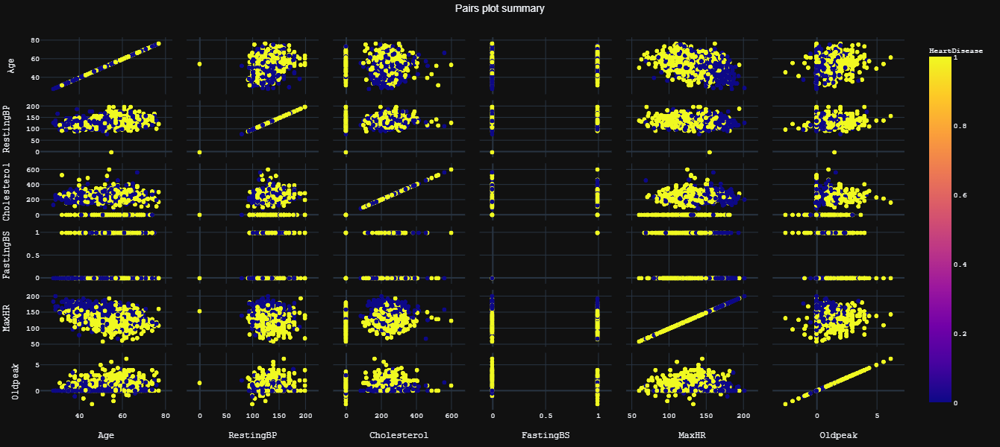

 -- Summary of numerical columns --


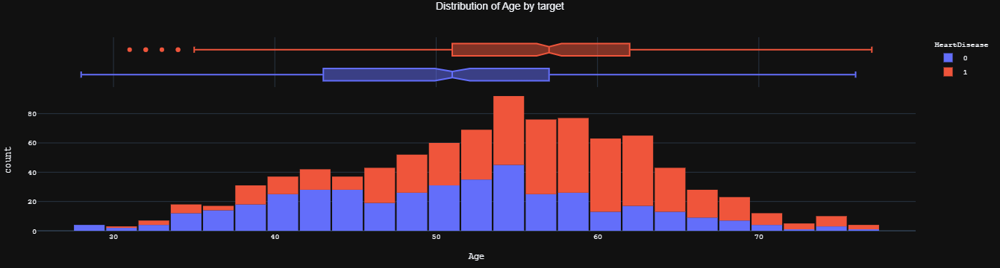

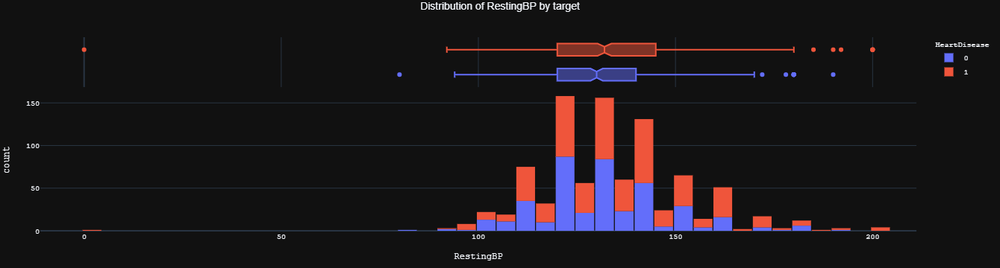

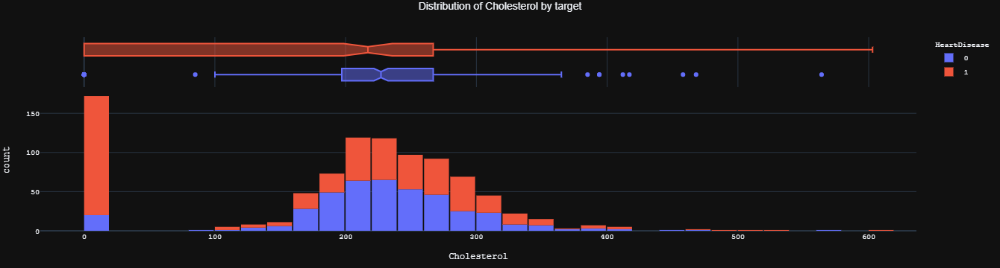

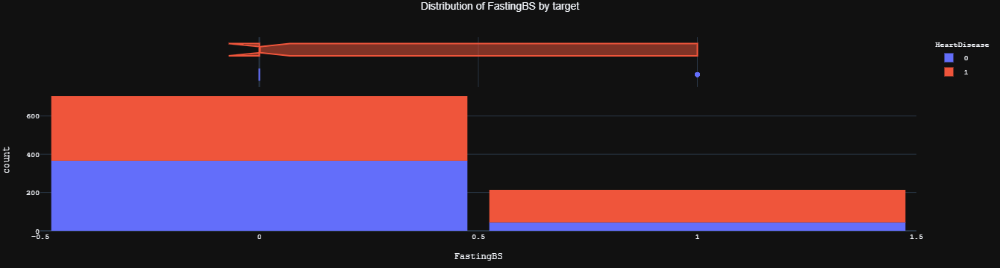

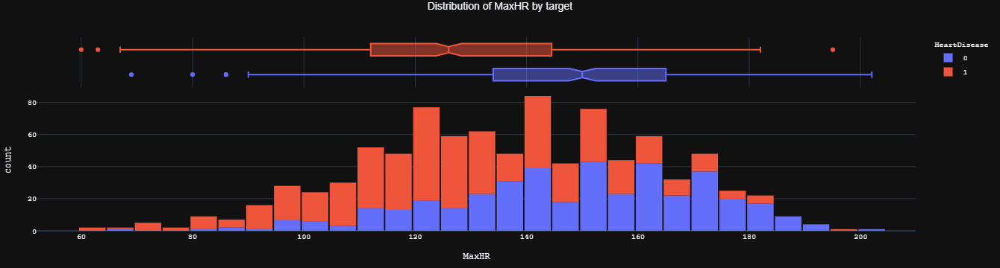

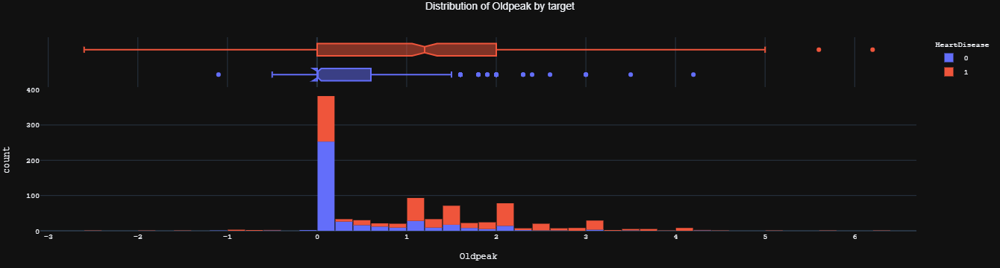

In [11]:
# EDA 
pair_plot(df, y_col_c, h=600, w=800)
summarize_numeric_cols(df,y_col_c,b_w=0.05,h=300,w=500)

In [12]:
%%time

y_col_c = 'HeartDisease'
# Data pre-processing, Models & Metrics
numeric_cols,categorical_cols,x_ohe_col_names,\
y_train, y_test, X_train_all, X_test_all, \
X_train_poly2_all, X_test_poly2_all,\
X_train_poly3_all, X_test_poly3_all = pre_process_data(df,y_col_c,split=0.25,set_seed=2047)

Encoding categorical columns ... 0.0 mins elapsed.
Splitting the data ... 0.0 mins elapsed.
Scaling the data ... 0.0 mins elapsed.
Fitting polynoimials of degree 2 to numericals in data ... 0.001 mins elapsed.
Fitting polynoimials of degree 3 to numericals in data ... 0.001 mins elapsed.
CPU times: user 54.7 ms, sys: 9.97 ms, total: 64.6 ms
Wall time: 62.8 ms


Running models and metrics for iteration - Heart Failure Prediction - Raw
100%|██████████| 5/5 [00:02<00:00,  2.07trial/s, best loss: -0.853242356923728] 
0.043 mins elapsed.
100%|██████████| 5/5 [00:01<00:00,  2.59trial/s, best loss: -0.8517825029091295]
0.078 mins elapsed.
100%|██████████| 10/10 [00:03<00:00,  3.25trial/s, best loss: -0.8546916322860467]
0.129 mins elapsed.
100%|██████████| 10/10 [00:02<00:00,  4.01trial/s, best loss: -0.8707077118375117]
0.174 mins elapsed.
100%|██████████| 5/5 [00:00<00:00, 21.97trial/s, best loss: -0.8503438061990902]
0.177 mins elapsed.
100%|██████████| 5/5 [00:00<00:00, 24.76trial/s, best loss: -0.8547339468951656]
0.181 mins elapsed.
100%|██████████| 10/10 [00:00<00:00, 24.27trial/s, best loss: -0.8460382947212526]
0.188 mins elapsed.
100%|██████████| 10/10 [00:01<00:00,  7.34trial/s, best loss: -9999.0]
0.211 mins elapsed.
100%|██████████| 10/10 [00:37<00:00,  3.75s/trial, best loss: -0.8401988786628584]
0.837 mins elapsed.
Running models and 

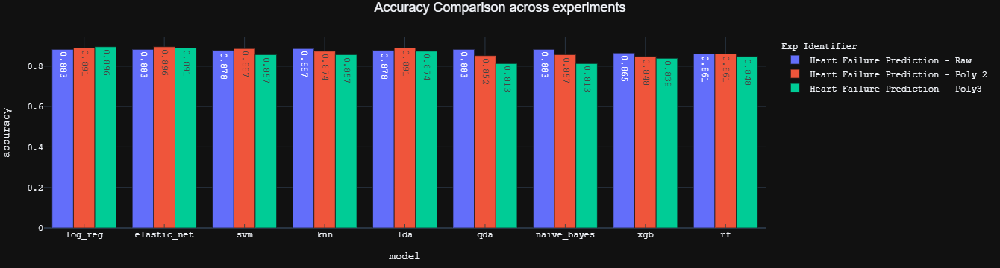

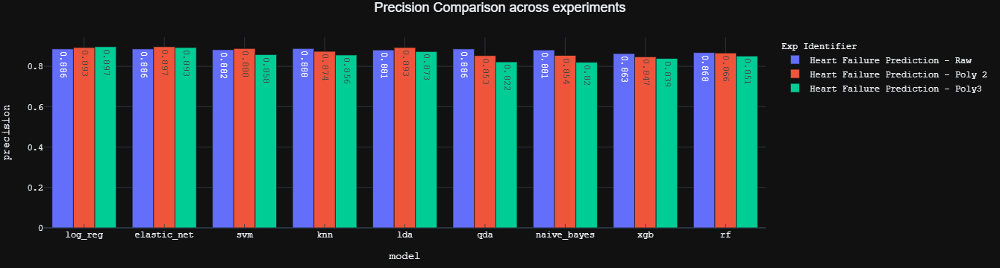

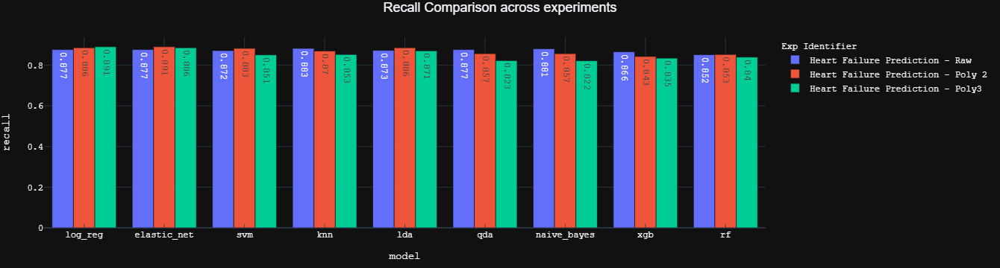

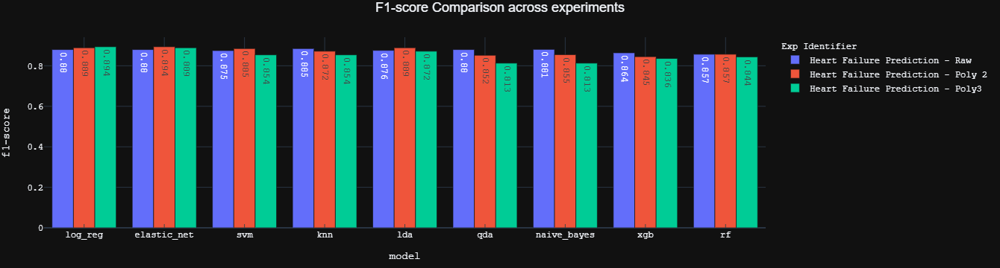

CPU times: user 41.8 s, sys: 2.2 s, total: 44 s
Wall time: 2min 43s


In [13]:
%%time

# Run models with tuning
best_params_all_iters = []
metrics_final = []
identifiers = ['Heart Failure Prediction - Raw','Heart Failure Prediction - Poly 2', 'Heart Failure Prediction - Poly3']
X_train_to_run = [X_train_all,X_train_poly2_all,X_train_poly3_all]
X_test_to_run = [X_test_all,X_test_poly2_all,X_test_poly3_all]

for i in range(3):
    print(f'Running models and metrics for iteration - {identifiers[i]}')
    models_to_run = ['log_reg','elastic_net','svm','knn','lda','qda','naive_bayes','xgb','rf']
    best_params_c = run_models_on_dataset(
        models_to_run, X_train_to_run[i], y_train, max_runs_per_model = [5,5,10,10,5,5,10,10,10],rand_int = 2047)
    best_params_all_iters.append(best_params_c)
    
    metrics_c = make_metrics(
        best_params_c,
        X_train_to_run[i],y_train,X_test_to_run[i],y_test,
        identifiers[i])
    metrics_final.append(metrics_c)
metrics_final_combined = pd.concat(metrics_final).round(3)

# Plot metric comparison
for metric in ['accuracy','precision','recall','f1-score']:
    fig_spec_mix = px.bar(
        metrics_final_combined, x='model', y=metric,color='Exp Identifier',
        text=metrics_final_combined[metric],barmode='group');
    fig_spec_mix.update_xaxes(showgrid=True,ticks='inside',tickformat='%b%y',);
    fig_spec_mix['layout'].update(
        height=250,margin=go.layout.Margin(l=50, r=50, t=50, b=50),
        template='plotly_dark',font=dict(size=12,family="Courier New"),
        title=dict(font_size=18,text=f"{metric.capitalize()} Comparison across experiments"
                   ,font_family="Arial",y=0.99,x=0.5,xanchor='center',yanchor='top'),);
    fig_spec_mix.show();

# Dataset 2

In [44]:
# Load dataset
df = pd.read_csv("/kaggle/input/company-bankruptcy-prediction/data.csv")

In [45]:
# Datset summary 
y_col_c = 'Bankrupt?'
print(f'Dataset shape - {df.shape}')
print('Unique counts in target colunm:')
df[y_col_c].value_counts()

df.describe()

Dataset shape - (6819, 96)
Unique counts in target colunm:


0    6599
1     220
Name: Bankrupt?, dtype: int64

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Operating Expense Rate,Research and development expense rate,Cash flow rate,Interest-bearing debt interest rate,Tax rate (A),Net Value Per Share (B),Net Value Per Share (A),Net Value Per Share (C),Persistent EPS in the Last Four Seasons,Cash Flow Per Share,Revenue Per Share (Yuan ¥),Operating Profit Per Share (Yuan ¥),Per Share Net profit before tax (Yuan ¥),Realized Sales Gross Profit Growth Rate,Operating Profit Growth Rate,After-tax Net Profit Growth Rate,Regular Net Profit Growth Rate,Continuous Net Profit Growth Rate,Total Asset Growth Rate,Net Value Growth Rate,Total Asset Return Growth Rate Ratio,Cash Reinvestment %,Current Ratio,Quick Ratio,Interest Expense Ratio,Total debt/Total net worth,Debt ratio %,Net worth/Assets,Long-term fund suitability ratio (A),Borrowing dependency,Contingent liabilities/Net worth,Operating profit/Paid-in capital,Net profit before tax/Paid-in capital,Inventory and accounts receivable/Net value,Total Asset Turnover,Accounts Receivable Turnover,Average Collection Days,Inventory Turnover Rate (times),Fixed Assets Turnover Frequency,Net Worth Turnover Rate (times),Revenue per person,Operating profit per person,Allocation rate per person,Working Capital to Total Assets,Quick Assets/Total Assets,Current Assets/Total Assets,Cash/Total Assets,Quick Assets/Current Liability,Cash/Current Liability,Current Liability to Assets,Operating Funds to Liability,Inventory/Working Capital,Inventory/Current Liability,Current Liabilities/Liability,Working Capital/Equity,Current Liabilities/Equity,Long-term Liability to Current Assets,Retained Earnings to Total Assets,Total income/Total expense,Total expense/Assets,Current Asset Turnover Rate,Quick Asset Turnover Rate,Working capitcal Turnover Rate,Cash Turnover Rate,Cash Flow to Sales,Fixed Assets to Assets,Current Liability to Liability,Current Liability to Equity,Equity to Long-term Liability,Cash Flow to Total Assets,Cash Flow to Liability,CFO to Assets,Cash Flow to Equity,Current Liability to Current Assets,Liability-Assets Flag,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000,6819.000
mean,0.032,0.505,0.559,0.554,0.608,0.608,0.999,0.797,0.809,0.304,0.781,1995347312.803,1950427306.057,0.467,16448012.906,0.115,0.191,0.191,0.191,0.229,0.323,1328640.602,0.109,0.184,0.022,0.848,0.689,0.689,0.218,5508096595.249,1566212.055,0.264,0.380,403284.954,8376594.820,0.631,4416336.714,0.113,0.887,0.009,0.375,0.006,0.109,0.183,0.402,0.142,12789705.238,9826220.861,2149106056.608,1008595981.818,0.039,2325854.266,0.401,11255785.322,0.814,0.400,0.522,0.124,359

In [47]:
%%time

# All numeric, no categiorical, need to remove multi-collinear features
# and do some feature selection before running models, otherwise there will 
# be explosion in number of features after polynomial fit

vif_train_vals, vif_cols_to_keep = get_vif_df(df,[y_col_c],vif_tol=5.0)
df_final, fs = feature_select_df(df[vif_cols_to_keep+[y_col_c]],y_col_c,n=10)
df_final_filt = pd.concat(
    [df_final[df_final[y_col_c]==1].reset_index(drop=True),
     df_final[df_final[y_col_c]==0].sample(n=500, random_state=2047).reset_index(drop=True)],
    axis=0,ignore_index=True)

CPU times: user 15.8 s, sys: 5.23 s, total: 21.1 s
Wall time: 5.35 s


In [48]:
# Datset summary after resampling
print(f'Dataset shape - {df_final_filt.shape}')
print('Unique counts in target colunm:')
df_final_filt[y_col_c].value_counts()

df_final_filt.describe()

Dataset shape - (720, 11)
Unique counts in target colunm:


0    500
1    220
Name: Bankrupt?, dtype: int64

,Tax rate (A),Operating profit per person,Quick Assets/Total Assets,Cash/Total Assets,Cash/Current Liability,Retained Earnings to Total Assets,Total expense/Assets,Current Liability to Current Assets,Liability-Assets Flag,Equity to Liability,Bankrupt?
count,720.000,720.000,720.000,720.000,720.000,720.000,720.000,720.000,720.000,720.000,720.000
mean,0.092,0.396,0.375,0.103,106718055.567,0.925,0.035,0.040,0.008,0.042,0.306
std,0.139,0.031,0.205,0.128,818016786.389,0.030,0.036,0.036,0.091,0.063,0.461
min,0.000,0.302,0.017,0.000,0.000,0.729,0.002,0.000,0.000,0.004,0.000
25%,0.000,0.389,0.215,0.023,0.001,0.919,0.016,0.021,0.000,0.020,0.000
50%,0.000,0.394,0.362,0.057,0.003,0.933,0.025,0.033,0.000,0.028,0.000
75%,0.176,0.400,0.508,0.129,0.010,0.940,0.041,0.046,0.000,0.043,1.000
max,0.976,0.768,0.964,0.825,9410000000.000,0.994,0.463,0.461,1.000,0.921,1.000


 -- Summary of numerical columns --


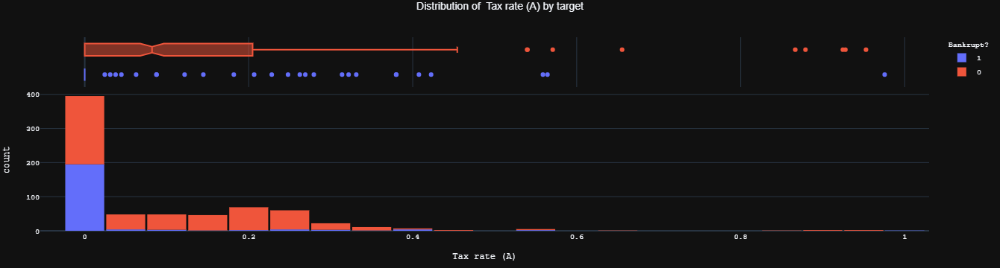

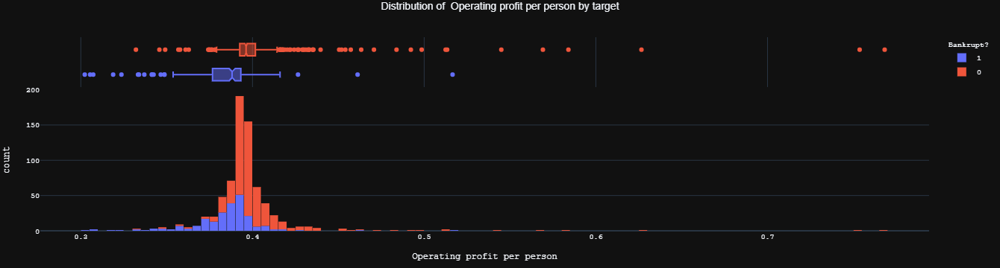

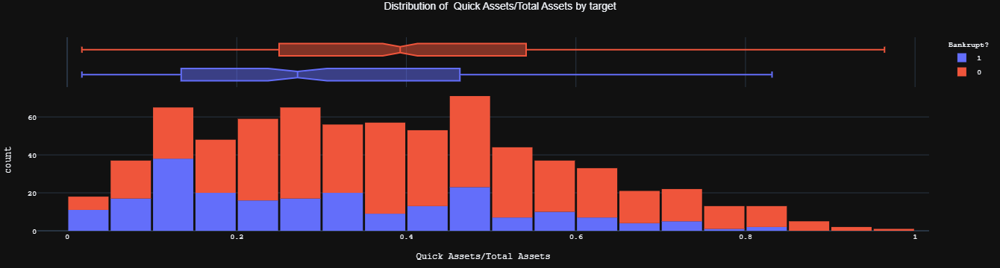

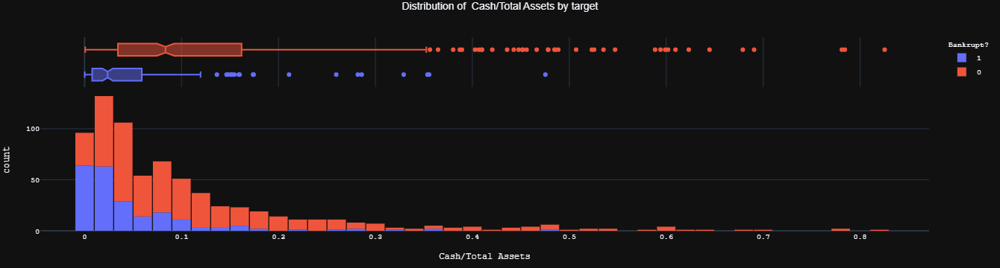

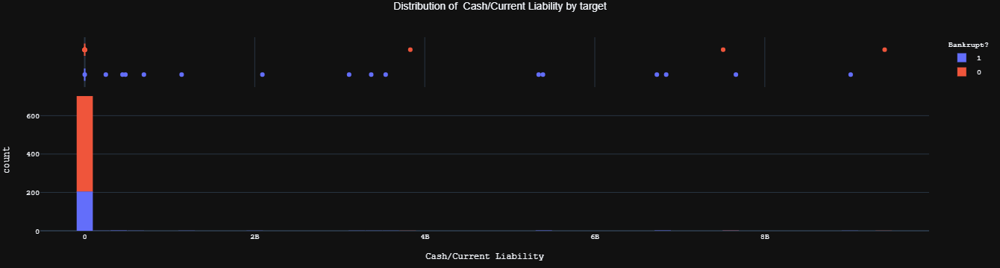

...

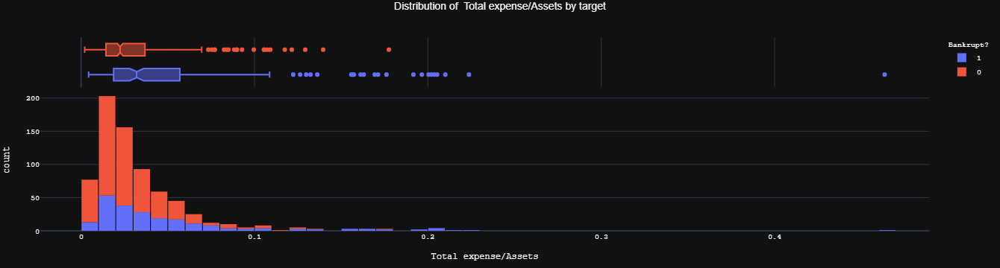

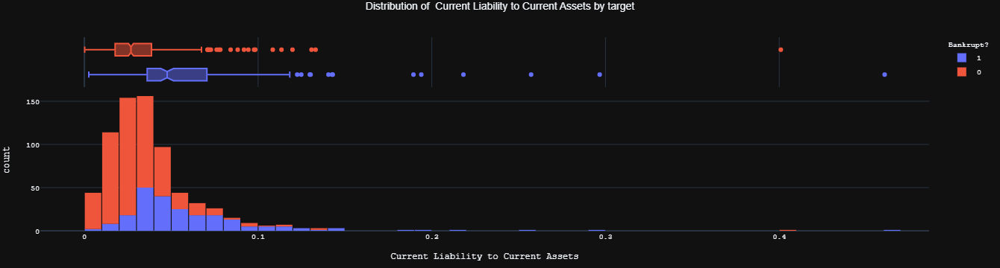

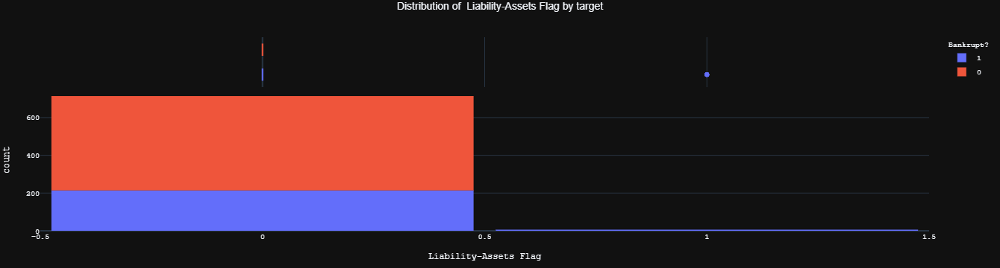

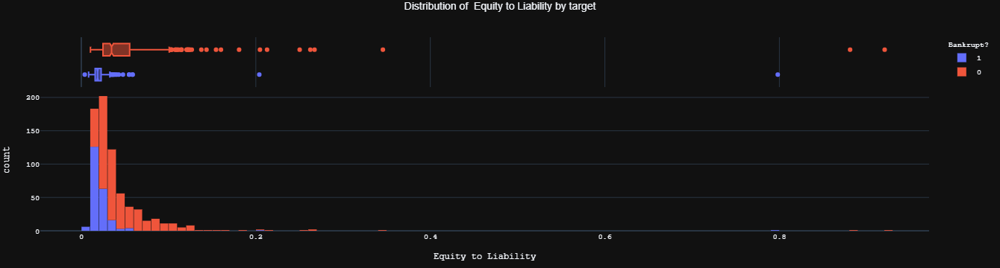

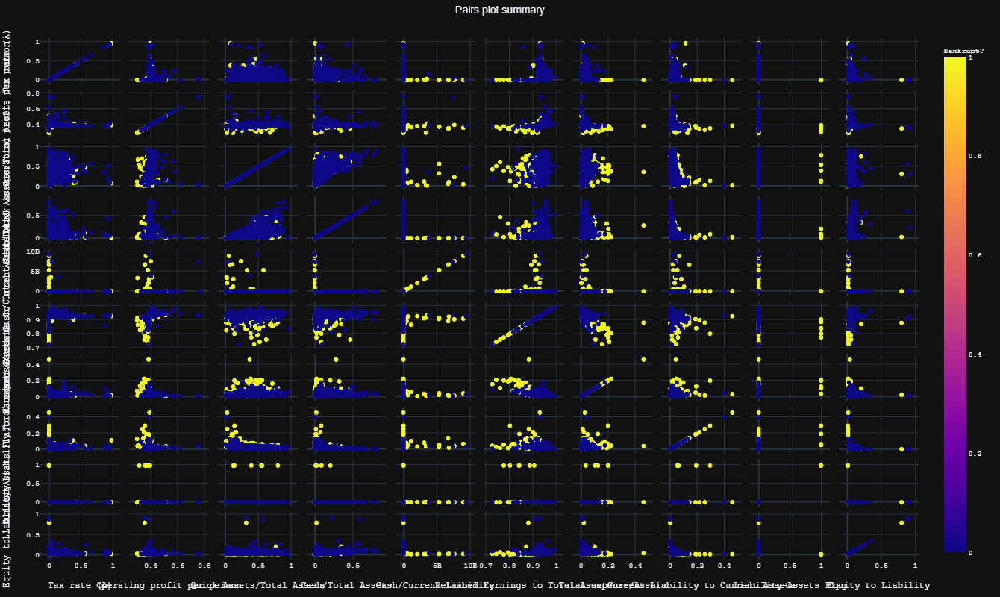

In [16]:
# EDA
summarize_numeric_cols(df_final_filt,y_col_c,b_w=0.05,h=300,w=500)
pair_plot(df_final_filt, y_col_c, h=800, w=800) # Too many columns, garbling the column names in plot
gc.collect();

In [19]:
%%time

# Data pre-processing, Models & Metrics
numeric_cols,categorical_cols,x_ohe_col_names,\
y_train, y_test, X_train_all, X_test_all, \
X_train_poly2_all, X_test_poly2_all,\
X_train_poly3_all, X_test_poly3_all = pre_process_data_non_cat(df_final_filt,y_col_c,split=0.25,set_seed=2047)

# Run models with tuning
best_params_all_iters = []
metrics_final = []
identifiers = ['Bankruptcy - Raw','Bankruptcy - Poly 2', 'Bankruptcy - Poly3']
X_train_to_run = [X_train_all,X_train_poly2_all,X_train_poly3_all]
X_test_to_run = [X_test_all,X_test_poly2_all,X_test_poly3_all]

simplefilter("ignore", category=ConvergenceWarning)
for i in range(3):
    print(f'Running models and metrics for iteration - {identifiers[i]}')
    models_to_run = ['log_reg','elastic_net','svm','knn','lda','qda','naive_bayes','xgb','rf']
    best_params_c = run_models_on_dataset(
        models_to_run, X_train_to_run[i], y_train, max_runs_per_model = [5,5,10,10,5,5,5,10,10],rand_int = 2047)
    best_params_all_iters.append(best_params_c)
    
    metrics_c = make_metrics(
        best_params_c,
        X_train_to_run[i],y_train,X_test_to_run[i],y_test,
        identifiers[i])
    metrics_final.append(metrics_c)
metrics_final_combined = pd.concat(metrics_final).round(3)

Splitting the data ... 0.0 mins elapsed.
Scaling the data ... 0.0 mins elapsed.
Fitting polynoimials of degree 2 to numericals in data ... 0.001 mins elapsed.
Fitting polynoimials of degree 3 to numericals in data ... 0.001 mins elapsed.
Running models and metrics for iteration - Bankruptcy - Raw
100%|██████████| 5/5 [00:02<00:00,  2.19trial/s, best loss: -0.8462962962962962]
0.041 mins elapsed.
100%|██████████| 5/5 [00:01<00:00,  2.73trial/s, best loss: -0.8537037037037036]
0.078 mins elapsed.
100%|██████████| 10/10 [00:01<00:00,  9.91trial/s, best loss: -0.8592592592592594]
0.094 mins elapsed.
100%|██████████| 10/10 [00:02<00:00,  4.11trial/s, best loss: -0.8407407407407408]
0.135 mins elapsed.
100%|██████████| 5/5 [00:00<00:00, 24.14trial/s, best loss: -0.8222222222222223]
0.139 mins elapsed.
100%|██████████| 5/5 [00:00<00:00, 24.42trial/s, best loss: -0.7777777777777779]
0.142 mins elapsed.
100%|██████████| 5/5 [00:00<00:00, 25.68trial/s, best loss: -0.7537037037037038]
0.146 mins 

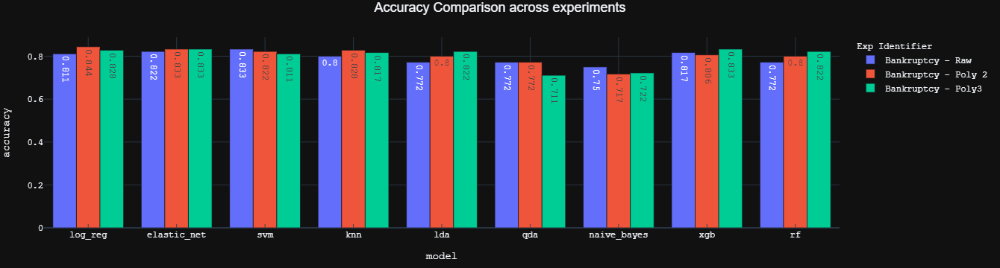

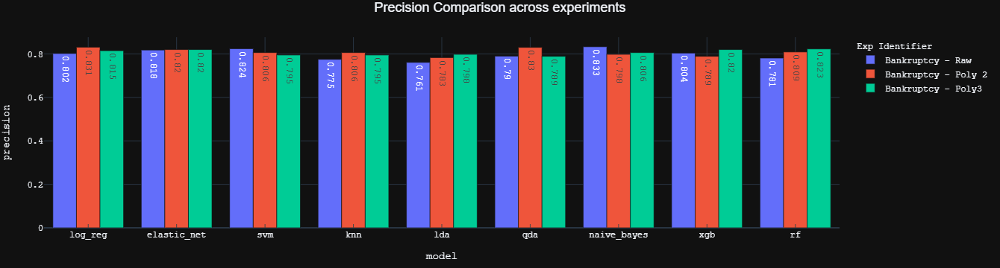

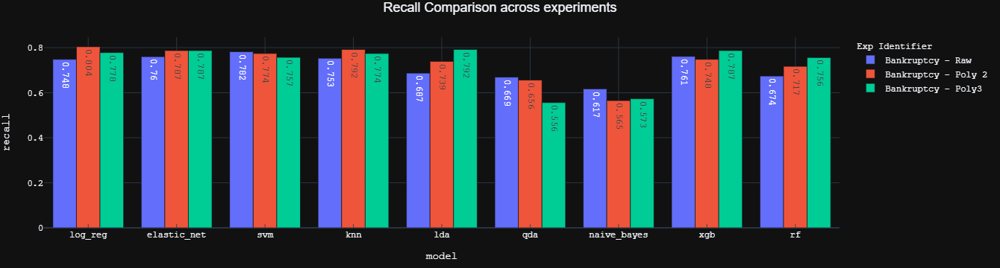

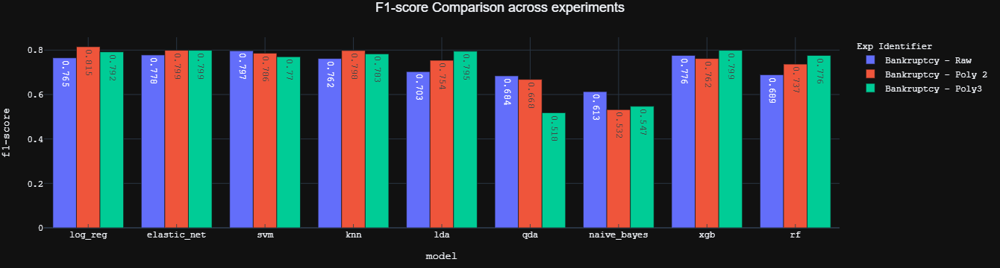

CPU times: user 390 ms, sys: 12 ms, total: 402 ms
Wall time: 398 ms


In [20]:
%%time

# Plot metric comparison
for metric in ['accuracy','precision','recall','f1-score']:
    fig_spec_mix = px.bar(
        metrics_final_combined, x='model', y=metric,color='Exp Identifier',
        text=metrics_final_combined[metric],barmode='group');
    fig_spec_mix.update_xaxes(showgrid=True,ticks='inside',tickformat='%b%y',);
    fig_spec_mix['layout'].update(
        height=250,margin=go.layout.Margin(l=50, r=50, t=50, b=50),
        template='plotly_dark',font=dict(size=12,family="Courier New"),
        title=dict(font_size=18,text=f"{metric.capitalize()} Comparison across experiments"
                   ,font_family="Arial",y=0.99,x=0.5,xanchor='center',yanchor='top'),);
    fig_spec_mix.show();

# Dataset 3

In [36]:
df = pd.read_excel('/kaggle/input/canadacaremissions/CanadaCarEmissions.xlsx')

# Remove some unwanted columns and pre-process the target column
del df['CO2 Rating']
df = df.dropna()
df['Smog Rating'] = np.where(df['Smog Rating']<=4.0,0,1)

y_col_c = 'Smog Rating'
# Resampling
df_final_filt = pd.concat(
    [df[df[y_col_c]==1].sample(n=1000, random_state=2047).reset_index(drop=True),
     df[df[y_col_c]==0].sample(n=1000, random_state=2047).reset_index(drop=True)],
    axis=0,ignore_index=True)

In [37]:
# Datset summary 
print(f'Dataset shape - {df_final_filt.shape}')
print('Unique counts in target colunm:')
df_final_filt[y_col_c].value_counts()

df_final_filt.describe()

Dataset shape - (2000, 14)
Unique counts in target colunm:


1    1000
0    1000
Name: Smog Rating, dtype: int64

,MODEL YEAR,ENGINE SIZE (L),CYLINDERS,FUEL CONSUMPTION CITY (L/100),FUEL CONSUMPTION HWY (L/100),COMB (L/100 km),COMB (mpg),CO2 EMISSIONS (g/km),Smog Rating
count,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000
mean,2019.430,3.235,5.778,12.673,9.247,11.129,27.128,258.167,0.500
std,1.626,1.408,1.980,3.515,2.198,2.882,7.366,62.051,0.500
min,2017.000,0.900,3.000,4.200,4.200,4.200,12.000,99.000,0.000
25%,2018.000,2.000,4.000,10.300,7.700,9.100,22.000,214.000,0.000
50%,2019.000,3.000,6.000,12.200,8.900,10.700,26.000,253.000,0.500
75%,2021.000,4.000,8.000,14.900,10.600,13.000,31.000,299.000,1.000
max,2022.000,8.000,16.000,28.300,19.600,23.100,67.000,539.000,1.000


 -- Summary of numerical columns --


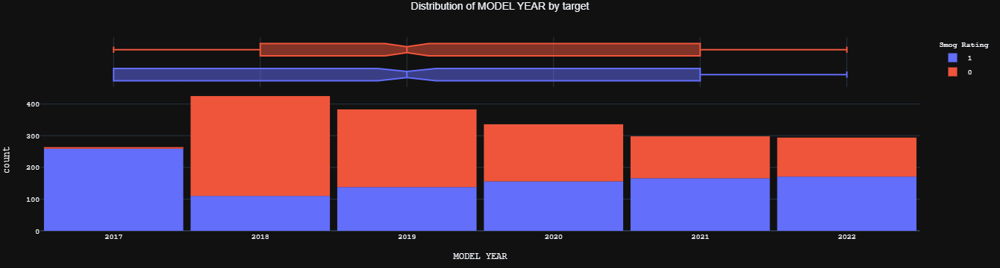

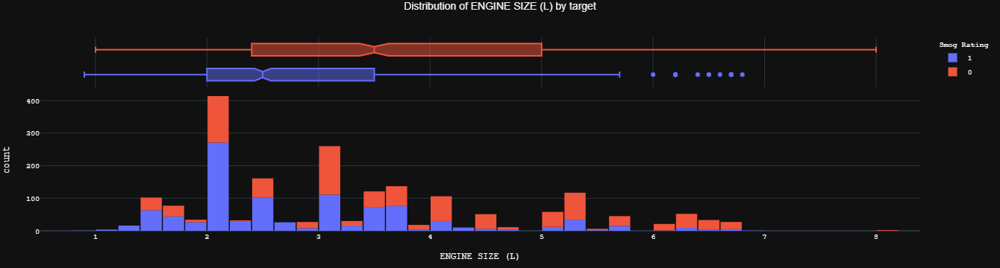

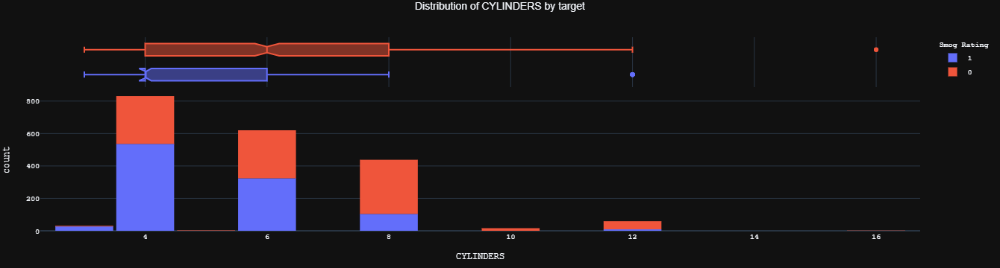

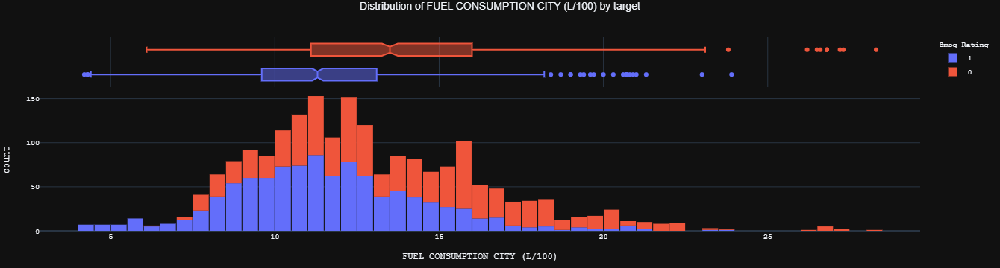

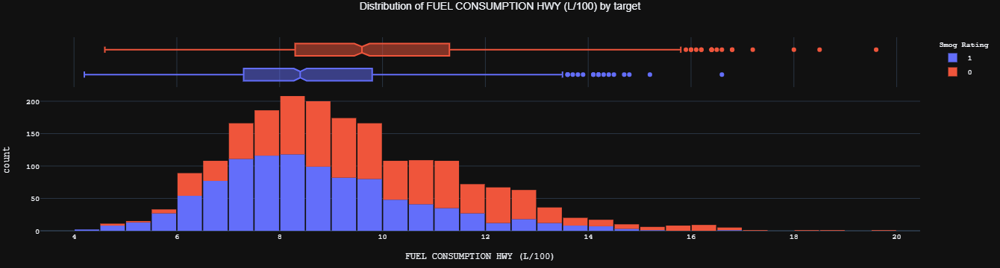

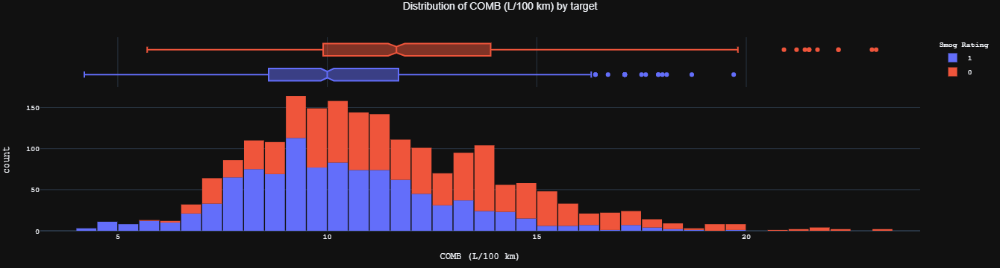

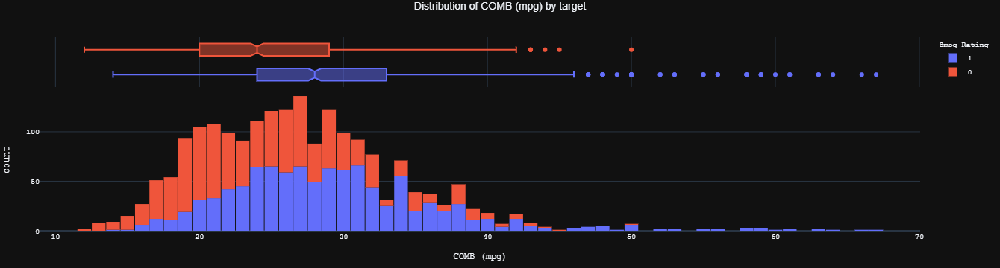

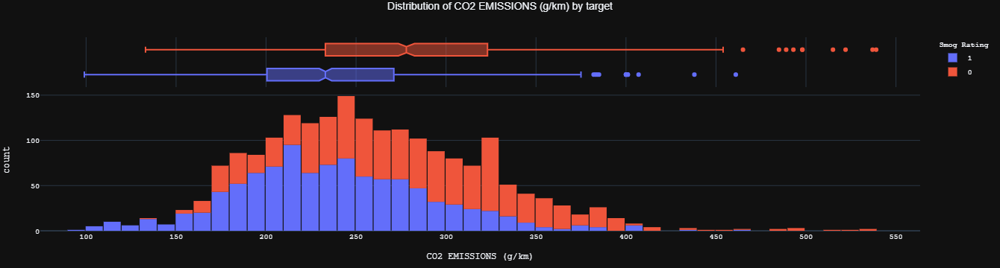

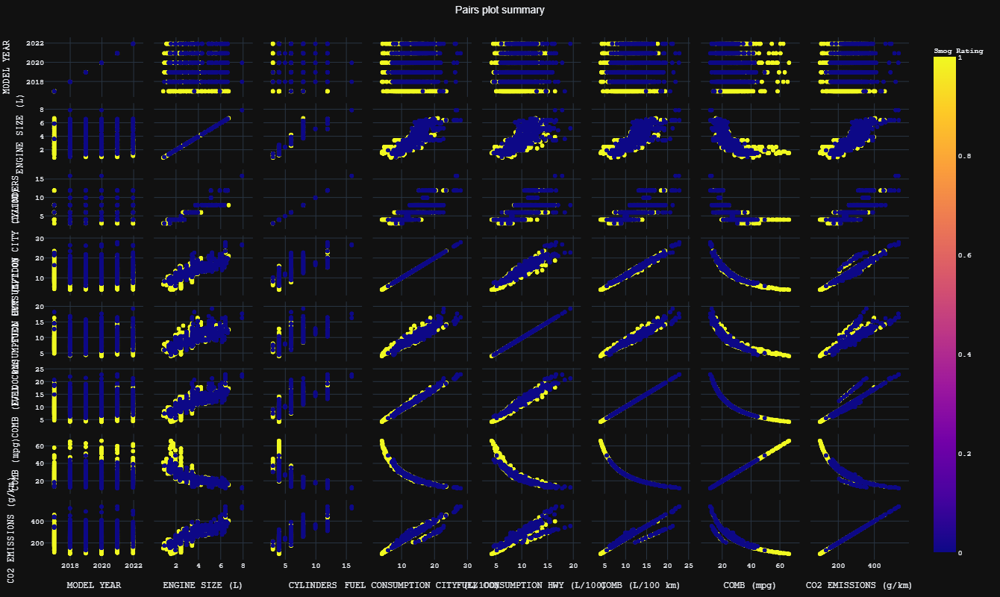

In [38]:
# EDA
y_col_c = 'Smog Rating'

summarize_numeric_cols(df_final_filt,y_col_c,b_w=0.05,h=300,w=500)
pair_plot(df_final_filt, y_col_c, h=800, w=800) # Too many columns, garbling the column names in plot
gc.collect();

In [39]:
%%time

# Data pre-processing, Models & Metrics
numeric_cols,categorical_cols,x_ohe_col_names,\
y_train, y_test, X_train_all, X_test_all, \
X_train_poly2_all, X_test_poly2_all,\
X_train_poly3_all, X_test_poly3_all = pre_process_data_non_cat(df_final_filt,y_col_c,split=0.25,set_seed=2047)

Encoding categorical columns ... 0.0 mins elapsed.
Splitting the data ... 0.0 mins elapsed.
Scaling the data ... 0.001 mins elapsed.
Fitting polynoimials of degree 2 to numericals in data ... 0.001 mins elapsed.
Fitting polynoimials of degree 3 to numericals in data ... 0.002 mins elapsed.
CPU times: user 91.8 ms, sys: 959 µs, total: 92.7 ms
Wall time: 91.6 ms


In [41]:
%%time

# Run models with tuning
best_params_all_iters = []
metrics_final = []
identifiers = ['SMOG - Raw','SMOG - Poly 2', 'SMOG - Poly3']
X_train_to_run = [X_train_all,X_train_poly2_all,X_train_poly3_all]
X_test_to_run = [X_test_all,X_test_poly2_all,X_test_poly3_all]

simplefilter("ignore", category=ConvergenceWarning)
for i in range(3):
    print(f'Running models and metrics for iteration - {identifiers[i]}')
    models_to_run = ['log_reg','elastic_net','svm','knn','lda','qda','naive_bayes','xgb','rf']
    best_params_c = run_models_on_dataset(
        models_to_run, X_train_to_run[i], y_train, max_runs_per_model = [5,5,5,5,5,5,5,10,10],rand_int = 2047)
    best_params_all_iters.append(best_params_c)
    
    metrics_c = make_metrics(
        best_params_c,
        X_train_to_run[i],y_train,X_test_to_run[i],y_test,
        identifiers[i])
    metrics_final.append(metrics_c)
metrics_final_combined = pd.concat(metrics_final).round(3)

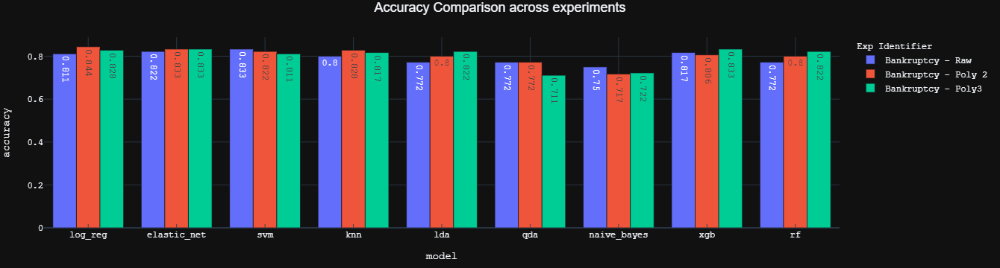

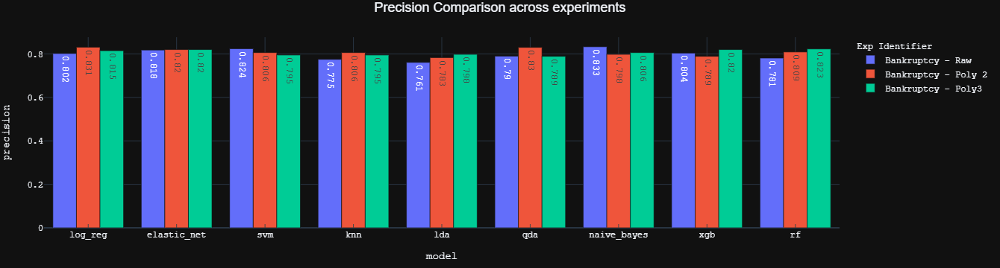

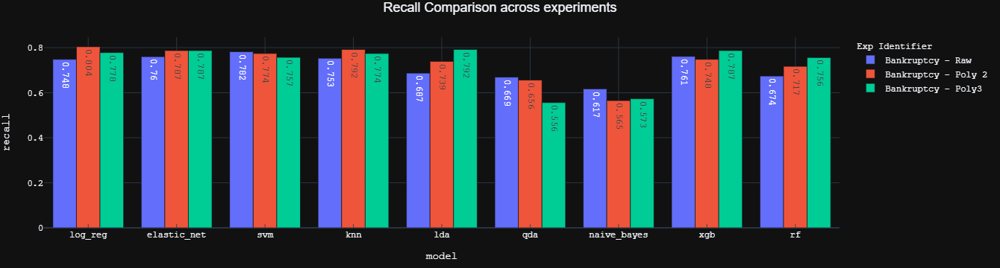

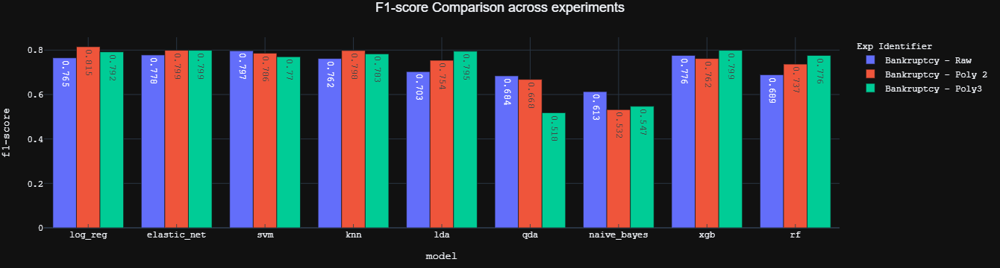

CPU times: user 372 ms, sys: 11.9 ms, total: 384 ms
Wall time: 381 ms


In [25]:
%%time

# Plot metric comparison
for metric in ['accuracy','precision','recall','f1-score']:
    fig_spec_mix = px.bar(
        metrics_final_combined, x='model', y=metric,color='Exp Identifier',
        text=metrics_final_combined[metric],barmode='group');
    fig_spec_mix.update_xaxes(showgrid=True,ticks='inside',tickformat='%b%y',);
    fig_spec_mix['layout'].update(
        height=250,margin=go.layout.Margin(l=50, r=50, t=50, b=50),
        template='plotly_dark',font=dict(size=12,family="Courier New"),
        title=dict(font_size=18,text=f"{metric.capitalize()} Comparison across experiments"
                   ,font_family="Arial",y=0.99,x=0.5,xanchor='center',yanchor='top'),);
    fig_spec_mix.show();

# Dataset 4 

In [49]:
df = pd.read_csv('/kaggle/input/forest-cover-type-dataset/covtype.csv')

# Sampling to account for dataset size
y_col = 'Cover_Type'
df_filt = df[df[y_col].isin([1,2])]
df_filt[y_col] = np.where(df_filt[y_col]==2,0,1)
df_final_filt = pd.concat(
    [df_filt[df_filt[y_col]==0].sample(n=1000, random_state=2047).reset_index(drop=True),
     df_filt[df_filt[y_col]==1].sample(n=1000, random_state=2047).reset_index(drop=True)],
    axis=0,ignore_index=True)

In [51]:
# Datset summary 
print(f'Dataset shape - {df_final_filt.shape}')
print('Unique counts in target colunm:')
df_final_filt[y_col_c].value_counts()

df_final_filt.describe()

Dataset shape - (2000, 55)
Unique counts in target colunm:


0    1000
1    1000
Name: Cover_Type, dtype: int64

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000,2000.000
mean,3026.595,158.406,13.398,272.767,45.114,2522.847,213.013,224.957,143.862,2057.410,0.504,0.059,0.430,0.005,0.000,0.003,0.001,0.007,0.000,0.002,0.000,0.000,0.004,0.021,0.021,0.052,0.038,0.000,0.000,0.004,0.001,0.003,0.007,0.016,0.001,0.071,0.121,0.044,0.002,0.004,0.003,0.003,0.219,0.060,0.044,0.107,0.085,0.003,0.001,0.000,0.000,0.025,0.019,0.008,0.500
std,200.765,112.045,6.929,213.095,55.931,1558.433,25.254,18.022,36.427,1327.810,0.500,0.237,0.495,0.074,0.000,0.050,0.032,0.083,0.000,0.039,0.000,0.000,0.063,0.142,0.143,0.222,0.191,0.000,0.000,0.067,0.022,0.050,0.086,0.126,0.022,0.258,0.327,0.206,0.039,0.063,0.055,0.055,0.414,0.238,0.206,0.309,0.279,0.050,0.032,0.000,0.000,0.158,0.137,0.089,0.500
min,2344.000,0.000,0.000,0.000,-102.000,60.000,79.000,105.000,0.000,60.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
25%,2900.750,59.000,8.000,108.000,7.000,1261.750,199.000,215.000,120.000,1121.250,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
50%,3042.500,132.000,12.000,228.000,29.000,2222.500,217.000,227.000,145.000,1822.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.500
75%,3180.250,264.000,18.000,391.000,66.000,3589.250,231.000,238.000,168.000,2630.000,1.000,0.000,1.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1.000
max,3600.000,359.000,50.000,1358.000,383.000,7004.000,254.000,254.000,249.000,7112.000,1.000,1.000,1.000,1.000,0.000,1.000,1.000,1.000,0.000,1.000,0.000,0.000,1.000,1.000,1.000,1.000,1.000,0.000,0.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,1.000,0.000,0.000,1.000,1.000,1.000,1.000


 -- Summary of numerical columns --


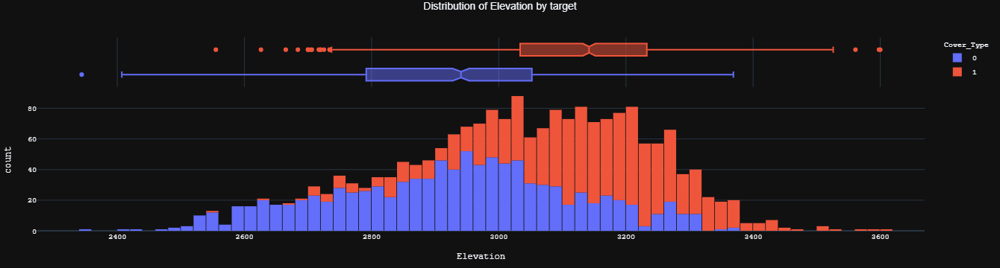

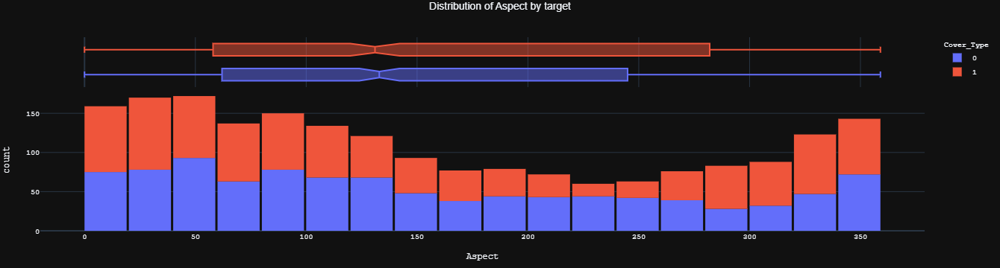

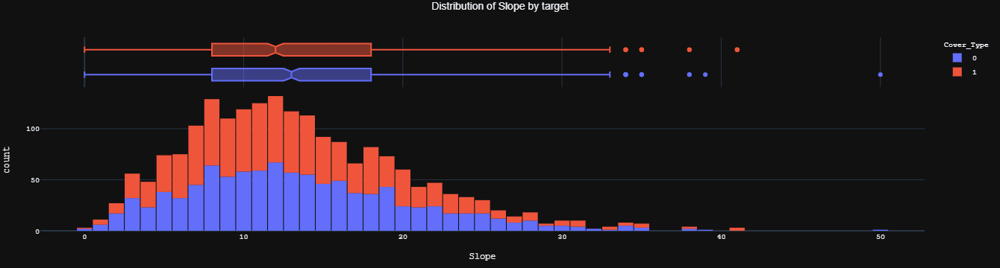

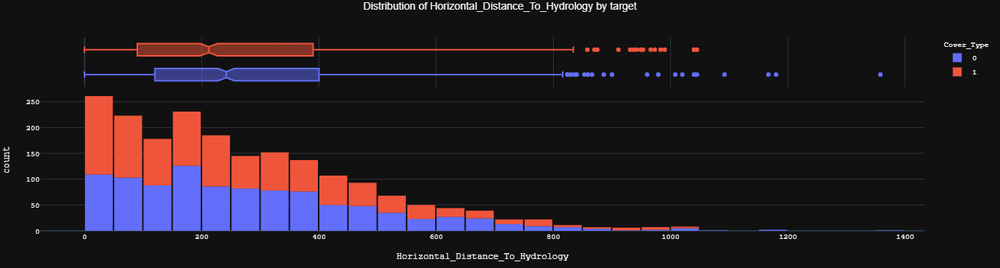

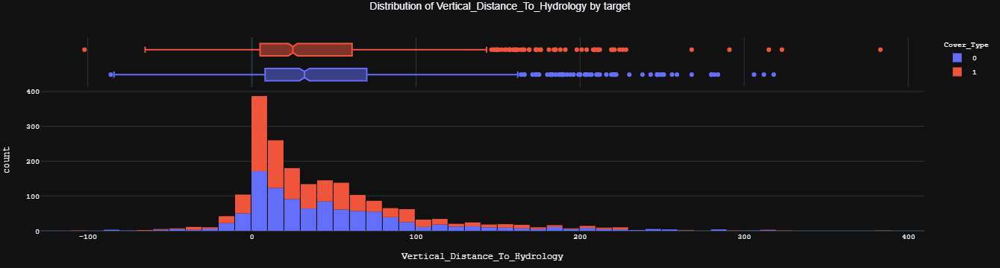

...

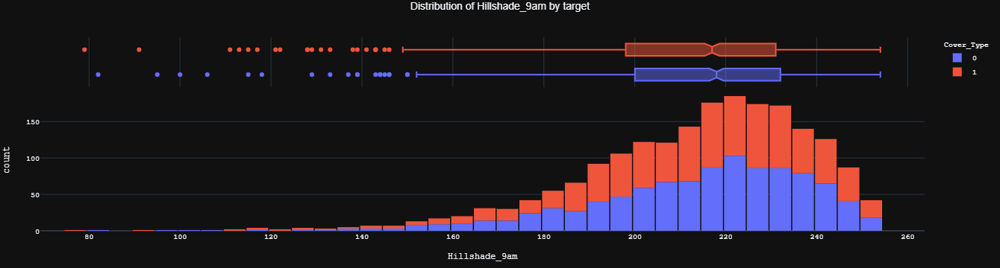

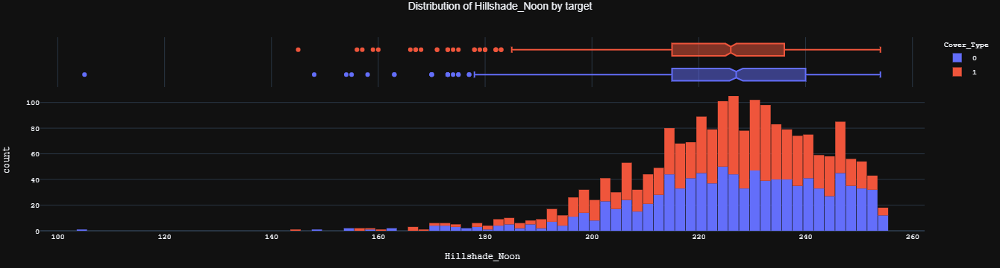

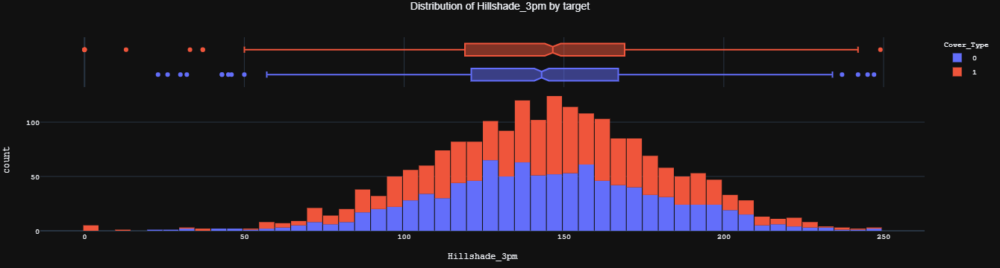

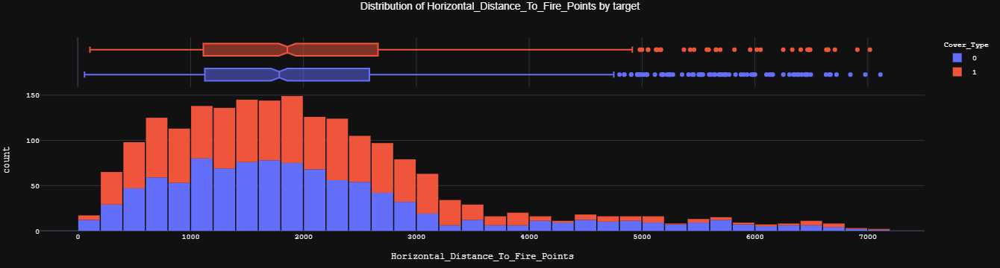

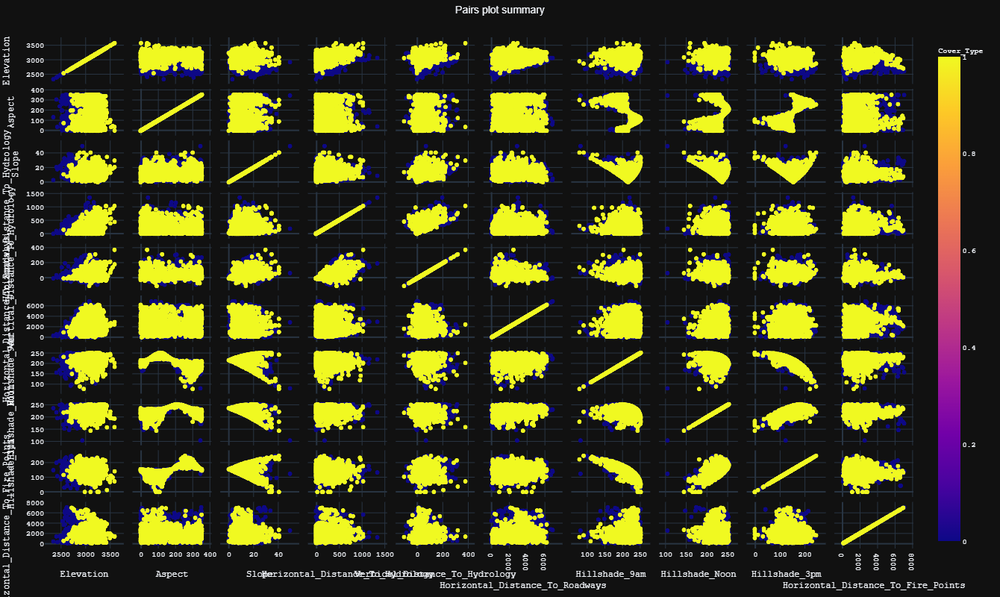

In [52]:
# EDA
y_col_c = 'Cover_Type'
cat_cols_default = [c for c in df_final_filt.columns if any(s in c for s in ['Wild','Soil'])]
summarize_numeric_cols(df_final_filt[[c for c in list(df_final_filt) if c not in cat_cols_default]],y_col_c,b_w=0.05,h=300,w=500)
pair_plot(df_final_filt[[c for c in list(df_final_filt) if c not in cat_cols_default]],
          y_col_c, h=800, w=800) # Too many columns, garbling the column names in plot
gc.collect();

In [53]:
%%time

numeric_cols,categorical_cols,x_ohe_col_names,\
y_train, y_test, X_train_all, X_test_all, \
X_train_poly2_all, X_test_poly2_all,\
X_train_poly3_all, X_test_poly3_all = pre_process_data(
    df_final_filt,
    y_col_c,
    cat_cols_default,
    split=0.25,set_seed=2047)

Encoding categorical columns ... 0.0 mins elapsed.
Splitting the data ... 0.0 mins elapsed.
Scaling the data ... 0.0 mins elapsed.
Fitting polynoimials of degree 2 to numericals in data ... 0.001 mins elapsed.
Fitting polynoimials of degree 3 to numericals in data ... 0.001 mins elapsed.
CPU times: user 82.2 ms, sys: 1.1 ms, total: 83.3 ms
Wall time: 81.7 ms


In [54]:
%%time

# Run models with tuning
best_params_all_iters = []
metrics_final = []
identifiers = ['Forest Cover - Raw','Forest Cover - Poly 2', 'Forest Cover - Poly3']
X_train_to_run = [X_train_all,X_train_poly2_all,X_train_poly3_all]
X_test_to_run = [X_test_all,X_test_poly2_all,X_test_poly3_all]

simplefilter("ignore", category=ConvergenceWarning)
for i in range(3):
    print(f'Running models and metrics for iteration - {identifiers[i]}')
    models_to_run = ['log_reg','elastic_net','svm','knn','lda','qda','naive_bayes','xgb','rf']
    best_params_c = run_models_on_dataset(
        models_to_run, X_train_to_run[i], y_train, max_runs_per_model = [5,5,5,5,5,5,5,10,10],rand_int = 2047)
    best_params_all_iters.append(best_params_c)
    
    metrics_c = make_metrics(
        best_params_c,
        X_train_to_run[i],y_train,X_test_to_run[i],y_test,
        identifiers[i])
    metrics_final.append(metrics_c)
metrics_final_combined = pd.concat(metrics_final).round(3)

Running models and metrics for iteration - Forest Cover - Raw
100%|██████████| 5/5 [00:02<00:00,  1.67trial/s, best loss: -0.7713333333333333]
0.052 mins elapsed.
100%|██████████| 5/5 [00:13<00:00,  2.76s/trial, best loss: -0.7699999999999999]
0.285 mins elapsed.
100%|██████████| 5/5 [00:07<00:00,  1.57s/trial, best loss: -0.778]             
0.416 mins elapsed.
100%|██████████| 5/5 [00:02<00:00,  2.19trial/s, best loss: -0.7446666666666667]
0.454 mins elapsed.
100%|██████████| 5/5 [00:01<00:00,  4.22trial/s, best loss: -0.7786666666666666]
0.474 mins elapsed.
100%|██████████| 5/5 [00:01<00:00,  4.47trial/s, best loss: -0.7526666666666667]
0.493 mins elapsed.
100%|██████████| 5/5 [00:00<00:00,  6.42trial/s, best loss: -0.576]
0.506 mins elapsed.
100%|██████████| 10/10 [00:02<00:00,  3.74trial/s, best loss: -9999.0]
0.551 mins elapsed.
100%|██████████| 10/10 [00:38<00:00,  3.89s/trial, best loss: -0.7293333333333334]
1.199 mins elapsed.
Running models and metrics for iteration - Forest 

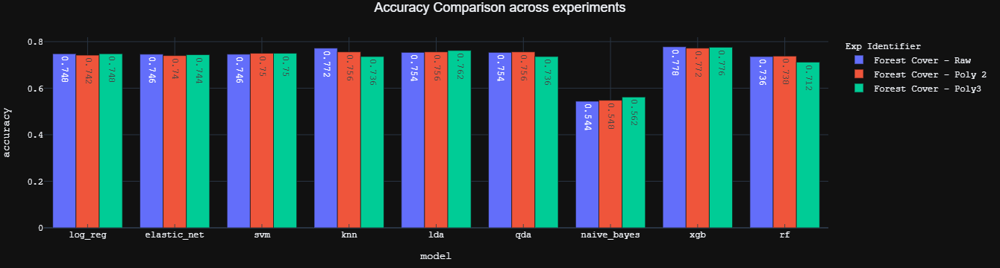

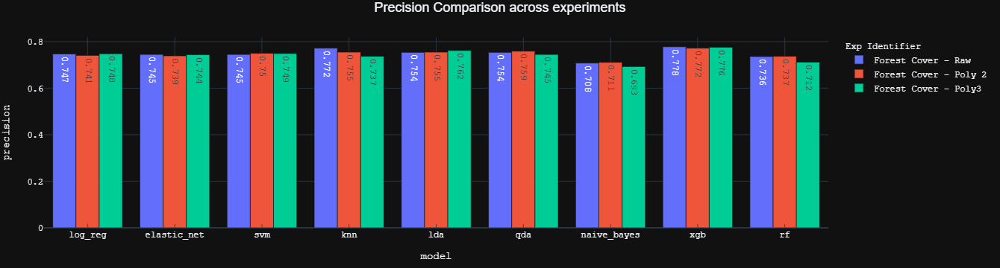

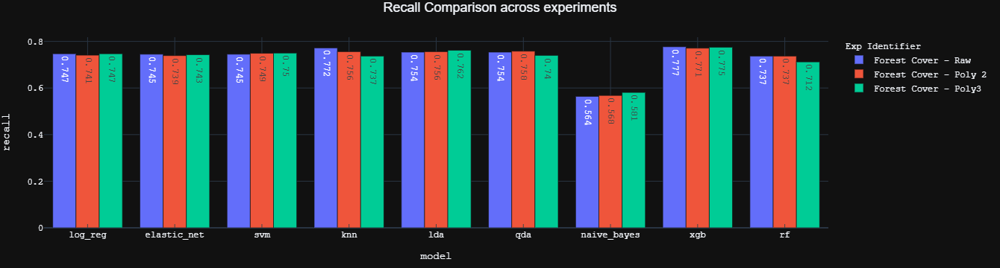

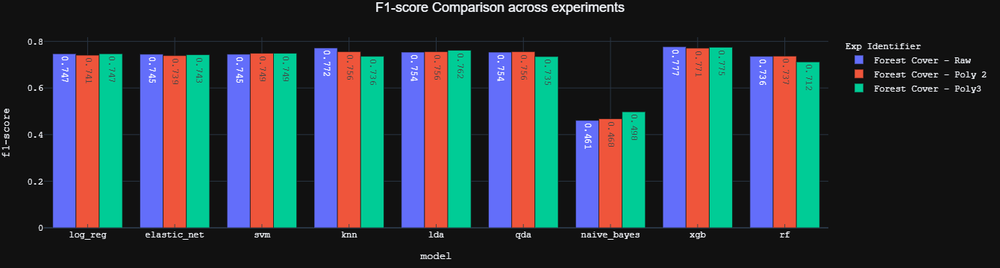

CPU times: user 380 ms, sys: 4.91 ms, total: 384 ms
Wall time: 382 ms


In [55]:
%%time

# Plot metric comparison
for metric in ['accuracy','precision','recall','f1-score']:
    fig_spec_mix = px.bar(
        metrics_final_combined, x='model', y=metric,color='Exp Identifier',
        text=metrics_final_combined[metric],barmode='group');
    fig_spec_mix.update_xaxes(showgrid=True,ticks='inside',tickformat='%b%y',);
    fig_spec_mix['layout'].update(
        height=250,margin=go.layout.Margin(l=50, r=50, t=50, b=50),
        template='plotly_dark',font=dict(size=12,family="Courier New"),
        title=dict(font_size=18,text=f"{metric.capitalize()} Comparison across experiments"
                   ,font_family="Arial",y=0.99,x=0.5,xanchor='center',yanchor='top'),);
    fig_spec_mix.show();